# Imports and Functions

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
# Importing a separate notebook that has all of the calculation functions
# Hoping to use this for convnience when running these calculations for different clusters

%run /home/jail/dlusers/ricardo_vega/Silva_OC_Project/Universal_Functions.ipynb

# MC Data Setup

In [3]:
pwd

'/home/jail/dlusers/ricardo_vega/Silva_OC_Project/Data_Exercises-Projects/Project_4'

In [4]:
data_folder = "/home/jail/dlusers/ricardo_vega/Silva_OC_Project/Data_Exercises-Projects/Project_4/Imported Files/"
data_file = "oc_NGC_2682_candidates.pickle"

In [5]:
# Creating dataframe for the MC dataset

manuel_m67 = pd.read_pickle(data_folder + data_file)
manuel_m67

,SOURCE_ID,ra,dec,parallax,pmra,pmdec,ruwe,phot_g_mean_flux,phot_g_mean_mag,phot_g_mean_flux_error,...,b,teff_gspphot,logg_gspphot,mh_gspphot,distance_gspphot,r_med_geo,r_med_photogeo,flag,fidelity_v2,cluster_flag
1,597267807268920320,132.460820,9.354456,0.673193,-4.467221,11.077062,1.047078,215.068576,19.855925,0.629092,...,30.523428,NaN,NaN,NaN,NaN,1299.076538,1208.512329,10033,0.989258,0
2,597267845924725504,132.447898,9.347820,3.808344,-20.515164,5.789698,1.034009,5331.716046,16.370199,2.415111,...,30.509059,3661.489258,4.7651,-0.1439,255.674393,259.710754,258.803558,10033,1.000000,0
3,597270693488802944,132.422902,9.353250,2.102317,-11.516026,-1.922608,1.067546,139.350261,20.327097,0.590102,...,30.489288,NaN,NaN,NaN,NaN,538.822510,1924.507568,10033,0.993164,0
4,597270762206349824,132.399934,9.357089,0.633316,-5.521866,-9.747638,1.036177,1236.516394,17.956867,1.150160,...,30.470616,4360.572754,4.7690,-1.4190,1057.928955,1644.195190,1669.303467,10033,0.965820,0
5,597270762206349952,132.413950,9.358508,1.372819,-2.926452,5.010006,1.009970,201.409130,19.927170,0.621971,...,30.483663,NaN,NaN,NaN,NaN,844.427246,1949.102539,10033,0.966797,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115521,607990248958012672,132.286291,12.234218,0.338400,-5.845476,-3.210716,1.026784,184.884382,20.020117,0.775067,...,31.598102,NaN,NaN,NaN,NaN,1680.500244,1050.966797,10033,0.917480,0
115522,607990248958101760,132.283761,12.228874,-1.269681,3.468348,-12.402405,1.000035,105.582835,20.628384,0.687994,...,31.593637,NaN,NaN,NaN,NaN,2229.045654,7877.241699,20033,0.993652,0
115523,607990283317791232,132.259641,12.237231,0.307591,1.553191,-4.156176,1.044939,367.272092,19.274897,0.899857,...,31.575647,NaN,NaN,NaN,NaN,2228.217285,5119.492188,10033,0.968750,0
115524,607990313381861376,132.273676,12.246604,0.734975,-1.931631,1.440591,1.012051,163.285038,20.155001,0.787233,...,31.592013,NaN,NaN,NaN,NaN,1570.699341,2914.147217,10033,0.965820,0


In [6]:
manuel_m67.columns

Index(['SOURCE_ID', 'ra', 'dec', 'parallax', 'pmra', 'pmdec', 'ruwe',
       'phot_g_mean_flux', 'phot_g_mean_mag', 'phot_g_mean_flux_error',
       'phot_bp_mean_flux', 'phot_bp_mean_mag', 'phot_bp_mean_flux_error',
       'phot_rp_mean_flux', 'phot_rp_mean_mag', 'phot_bp_mean_flux_error_2',
       'bp_rp', 'bp_g', 'g_rp', 'radial_velocity', 'radial_velocity_error',
       'l', 'b', 'teff_gspphot', 'logg_gspphot', 'mh_gspphot',
       'distance_gspphot', 'r_med_geo', 'r_med_photogeo', 'flag',
       'fidelity_v2', 'cluster_flag'],
      dtype='object')

In [7]:
# Setting the range for the new flux scale

x_max = manuel_m67.phot_g_mean_flux.max()
x_min = manuel_m67.phot_g_mean_flux.min()
new_max = 100
new_min = 0

In [8]:
# Scaling flux for the entire MC dataset

flux = manuel_m67.phot_g_mean_flux
rescaled_flux = flux_rescale(flux, x_max, x_min, new_max, new_min)
manuel_m67 = manuel_m67.assign(rescaled_flux=rescaled_flux)
manuel_m67

,SOURCE_ID,ra,dec,parallax,pmra,pmdec,ruwe,phot_g_mean_flux,phot_g_mean_mag,phot_g_mean_flux_error,...,teff_gspphot,logg_gspphot,mh_gspphot,distance_gspphot,r_med_geo,r_med_photogeo,flag,fidelity_v2,cluster_flag,rescaled_flux
1,597267807268920320,132.460820,9.354456,0.673193,-4.467221,11.077062,1.047078,215.068576,19.855925,0.629092,...,NaN,NaN,NaN,NaN,1299.076538,1208.512329,10033,0.989258,0,0.000038
2,597267845924725504,132.447898,9.347820,3.808344,-20.515164,5.789698,1.034009,5331.716046,16.370199,2.415111,...,3661.489258,4.7651,-0.1439,255.674393,259.710754,258.803558,10033,1.000000,0,0.001356
3,597270693488802944,132.422902,9.353250,2.102317,-11.516026,-1.922608,1.067546,139.350261,20.327097,0.590102,...,NaN,NaN,NaN,NaN,538.822510,1924.507568,10033,0.993164,0,0.000018
4,597270762206349824,132.399934,9.357089,0.633316,-5.521866,-9.747638,1.036177,1236.516394,17.956867,1.150160,...,4360.572754,4.7690,-1.4190,1057.928955,1644.195190,1669.303467,10033,0.965820,0,0.000301
5,597270762206349952,132.413950,9.358508,1.372819,-2.926452,5.010006,1.009970,201.409130,19.927170,0.621971,...,NaN,NaN,NaN,NaN,844.427246,1949.102539,10033,0.966797,0,0.000034
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115521,607990248958012672,132.286291,12.234218,0.338400,-5.845476,-3.210716,1.026784,184.884382,20.020117,0.775067,...,NaN,NaN,NaN,NaN,1680.500244,1050.966797,10033,0.917480,0,0.000030
115522,607990248958101760,132.283761,12.228874,-1.269681,3.468348,-12.402405,1.000035,105.582835,20.628384,0.687994,...,NaN,NaN,NaN,NaN,2229.045654,7877.241699,20033,0.993652,0,0.000009
115523,607990283317791232,132.259641,12.237231,0.307591,1.553191,-4.156176,1.044939,367.272092,19.274897,0.899857,...,NaN,NaN,NaN,NaN,2228.217285,5119.492188,10033,0.968750,0,0.000077
115524,607990313381861376,132.273676,12.246604,0.734975,-1.931631,1.440591,1.012051,163.285038,20.155001,0.787233,...,NaN,NaN,NaN,NaN,1570.699341,2914.147217,10033,0.965820,0,0.000024


In [9]:
# Isolating the MC cluster candidates

manuel_m67_cluster_candidates = manuel_m67[manuel_m67.cluster_flag == 1]
manuel_m67_cluster_candidates

,SOURCE_ID,ra,dec,parallax,pmra,pmdec,ruwe,phot_g_mean_flux,phot_g_mean_mag,phot_g_mean_flux_error,...,teff_gspphot,logg_gspphot,mh_gspphot,distance_gspphot,r_med_geo,r_med_photogeo,flag,fidelity_v2,cluster_flag,rescaled_flux
6840,597724757429410048,133.852332,9.910795,1.162087,-11.337732,-3.164445,0.971249,144.932767,20.284451,0.586108,...,NaN,NaN,NaN,NaN,907.323669,2767.098145,10033,0.999023,1,0.000020
10554,597830722862488064,133.851594,10.549505,1.095713,-11.165605,-2.984766,1.005734,1316.458900,17.888849,1.204375,...,3613.377197,4.4377,-1.1882,522.254822,894.107117,760.558960,10033,0.999512,1,0.000321
16832,598458269123799040,132.608282,10.113623,2.239033,-10.505732,-3.075372,1.081544,117.012186,20.516788,0.631274,...,NaN,NaN,NaN,NaN,824.530029,5074.922363,20033,0.957031,1,0.000012
16897,598459853967194112,132.706357,10.067045,1.170945,-10.726005,-2.621151,1.016172,12450.085388,15.449436,2.920325,...,4999.745605,4.5289,-0.3154,802.788025,823.028748,823.564697,10033,1.000000,1,0.003190
17076,598464900553093504,132.709590,10.198396,1.070715,-10.986817,-2.540939,0.924709,2319.786118,17.273746,1.418730,...,4345.453125,4.6256,0.2634,874.529297,909.852234,886.014587,10033,1.000000,1,0.000580
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114033,604024585394575616,135.082808,11.718627,1.092838,-11.165367,-2.605223,1.079241,156.722714,20.199537,0.718079,...,NaN,NaN,NaN,NaN,865.168030,2091.405762,10033,0.875977,1,0.000023
114864,604404359287255552,135.377416,11.927095,1.203797,-11.369593,-3.018275,0.947422,518.951913,18.899549,1.074042,...,3440.605957,4.9576,-0.4304,477.344086,827.501038,721.773193,10033,0.999512,1,0.000116
115019,604417828304774912,135.277368,12.018711,1.247194,-11.482671,-3.130053,0.982878,4696.161260,16.508009,2.291627,...,4537.705078,4.6409,0.5038,821.253296,782.960327,791.586792,10033,1.000000,1,0.001192
115418,607987427163771520,132.122303,12.109806,1.122718,-10.852459,-2.812150,0.911993,85856.495664,13.352934,15.149278,...,6066.637207,4.1884,-0.2716,858.107178,858.103882,856.543884,10033,1.000000,1,0.022102


# Basic Visualization

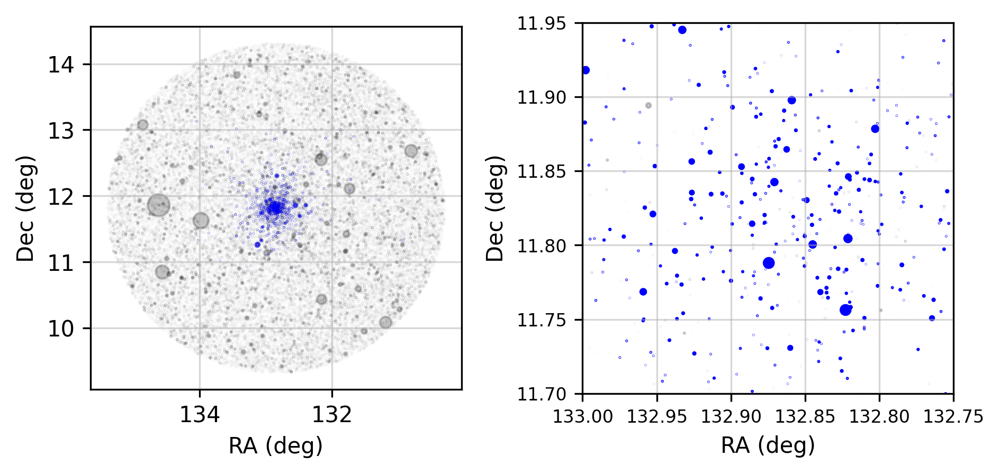

In [10]:
# Dec vs. RA for MC dataset, and zoomed into center of M67

plt.figure(dpi=300)

# Defining plot inputs
manuel_m67_ra = manuel_m67.ra
manuel_m67_dec = manuel_m67.dec
manuel_m67_cluster_candidates_ra = manuel_m67_cluster_candidates.ra
manuel_m67_cluster_candidates_dec = manuel_m67_cluster_candidates.dec
x_label = "RA (deg)"
y_label = "Dec (deg)"
all_flux = manuel_m67.rescaled_flux
candidate_flux = manuel_m67_cluster_candidates.rescaled_flux

# Entire MC dataset (left)
plt.subplot(1, 2, 1)
plt.scatter(manuel_m67_ra, manuel_m67_dec, s=all_flux, alpha=0.2, ec="black", fc="black")
plt.scatter(manuel_m67_cluster_candidates_ra, manuel_m67_cluster_candidates_dec, s=candidate_flux, alpha=0.5, ec="blue", fc="blue")
plt.xlabel(x_label)
plt.ylabel(y_label)
plt.grid(alpha=0.5)
plt.gca().invert_xaxis()
plt.gca().set_aspect(1)
plt.tight_layout()

# Zoomed into the center of the cluster (right)
plt.subplot(1, 2, 2)
plt.scatter(manuel_m67_ra, manuel_m67_dec, s=all_flux, alpha=0.2, ec="black", fc="black")
plt.scatter(manuel_m67_cluster_candidates_ra, manuel_m67_cluster_candidates_dec, s=candidate_flux*20, alpha=1, ec="blue", fc="blue")
plt.xlabel(x_label)
plt.ylabel(y_label)
plt.xlim(132.75, 133.)
plt.ylim(11.7, 11.95)
plt.grid(alpha=0.5)
plt.yticks(fontsize=8)
plt.xticks(fontsize=8)
plt.gca().invert_xaxis()
plt.gca().set_aspect(1)
plt.tight_layout()

In [11]:
# Testing for appropriate xlim/ylim values for the following PMDEC vs PMRA plot

print(manuel_m67_cluster_candidates.pmra.min(), manuel_m67_cluster_candidates.pmra.max())
print(manuel_m67_cluster_candidates.pmdec.min(), manuel_m67_cluster_candidates.pmdec.max())

-11.483472173806213 -10.50573191363194
-3.483646185130181 -2.5199118813435044


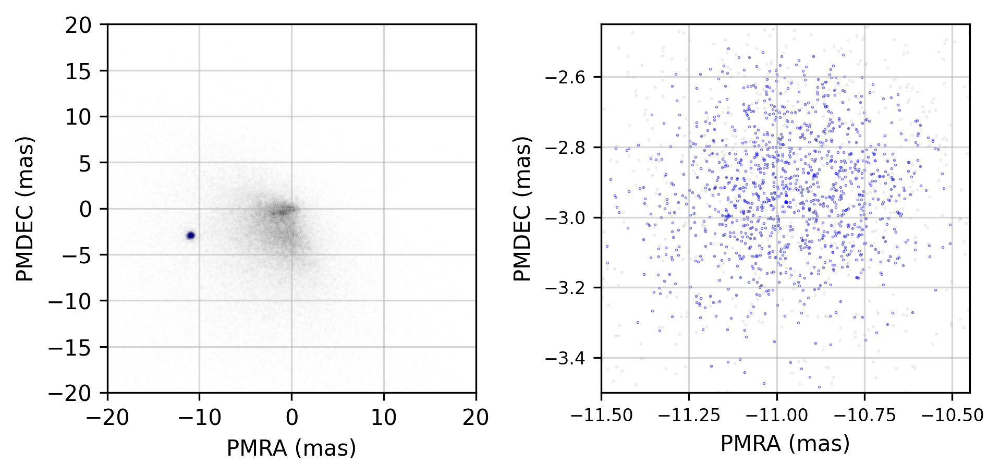

In [12]:
# PMDEC vs PMRA

plt.figure(dpi=300)

# Defining plot inputs
manuel_m67_pmra = manuel_m67.pmra
manuel_m67_pmdec = manuel_m67.pmdec
manuel_m67_cluster_candidates_pmra = manuel_m67_cluster_candidates.pmra
manuel_m67_cluster_candidates_pmdec = manuel_m67_cluster_candidates.pmdec
x_label = "PMRA (mas)"
y_label = "PMDEC (mas)"

# Entire MC dataset (left)
plt.subplot(1, 2, 1)
plt.scatter(manuel_m67_pmra, manuel_m67_pmdec, s=0.0001, alpha=0.2, ec="black", fc="black")
plt.scatter(manuel_m67_cluster_candidates_pmra, manuel_m67_cluster_candidates_pmdec, s=0.0001, alpha=0.2, ec="blue", fc="blue")
plt.xlabel(x_label)
plt.ylabel(y_label)
plt.xlim(-20, 20)
plt.ylim(-20, 20)
plt.grid(alpha=0.5)
plt.gca().set_aspect(1)
plt.tight_layout()

# Zoomed in to the cluster (right)
plt.subplot(1, 2, 2)
plt.scatter(manuel_m67_pmra, manuel_m67_pmdec, s=0.1, alpha=0.1, ec="black", fc="black")
plt.scatter(manuel_m67_cluster_candidates_pmra, manuel_m67_cluster_candidates_pmdec, s=0.1, alpha=0.5, ec="blue", fc="blue")
plt.xlabel(x_label)
plt.ylabel(y_label)
plt.xlim(-11.5, -10.45)
plt.ylim(-3.5, -2.45)
plt.grid(alpha=0.5)
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
plt.gca().set_aspect(1)
plt.tight_layout()

In [13]:
# Testing for appropriate xlim/ylim values for the following PMDEC vs parallax plot

print(manuel_m67_cluster_candidates.parallax.min(), manuel_m67_cluster_candidates.parallax.max())
print(manuel_m67_cluster_candidates.pmdec.min(), manuel_m67_cluster_candidates.pmdec.max())

1.0058203854588852 2.2390326769824616
-3.483646185130181 -2.5199118813435044


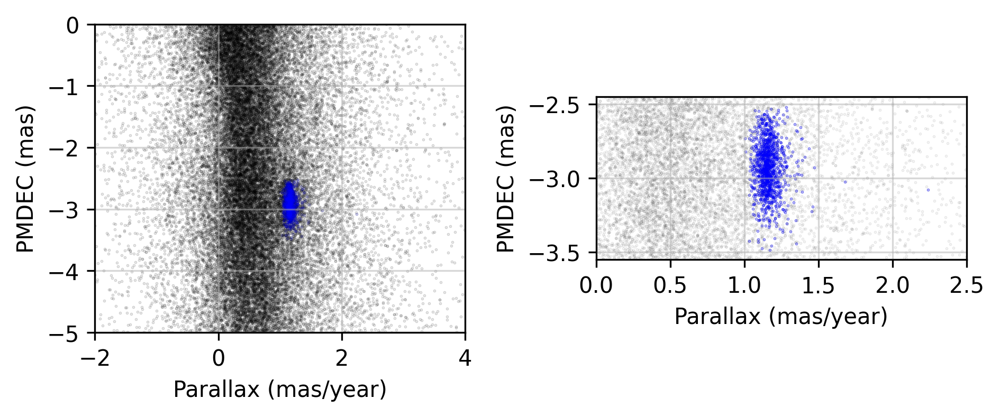

In [14]:
# PMDEC vs parallax

# Note: we have negative parallaxes in the dataset - this is due to error in the measurements and uncertainties
# Negative parallaxes are unphysical

plt.figure(dpi=300)

# Defining plot inputs
manuel_m67_pmdec = manuel_m67.pmdec
manuel_m67_parallax = manuel_m67.parallax
manuel_m67_cluster_candidates_pmdec = manuel_m67_cluster_candidates.pmdec
manuel_m67_cluster_candidates_parallax = manuel_m67_cluster_candidates.parallax
x_label = "Parallax (mas/year)"
y_label = "PMDEC (mas)"

# Entire MC dataset (left)
plt.subplot(1, 2, 1)
plt.scatter(manuel_m67_parallax, manuel_m67_pmdec, s=0.1, alpha=0.2, ec="black", fc="black")
plt.scatter(manuel_m67_cluster_candidates_parallax, manuel_m67_cluster_candidates_pmdec, s=0.1, alpha=0.2, ec="blue", fc="blue")
plt.xlabel(x_label)
plt.ylabel(y_label)
plt.xlim(-2, 4)
plt.ylim(-5, 0)
plt.grid(alpha=0.5)
plt.gca().set_aspect(1)
plt.tight_layout()

# Zoomed in to the cluster (right)
plt.subplot(1, 2, 2)
plt.scatter(manuel_m67_parallax, manuel_m67_pmdec, s=0.1, alpha=0.1, ec="black", fc="black")
plt.scatter(manuel_m67_cluster_candidates_parallax, manuel_m67_cluster_candidates_pmdec, s=0.1, alpha=0.5, ec="blue", fc="blue")
plt.xlabel(x_label)
plt.ylabel(y_label)
plt.xlim(0, 2.5)
plt.ylim(-3.55, -2.45)
plt.grid(alpha=0.5)
plt.gca().set_aspect(1)
plt.tight_layout()

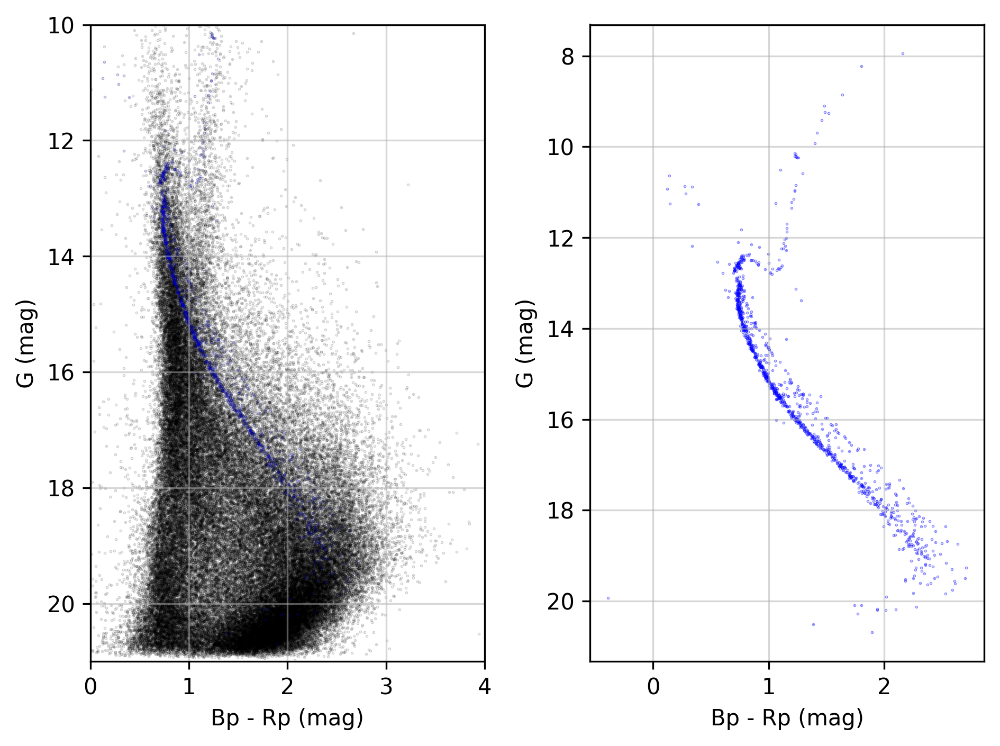

In [15]:
# G vs. Bp-Rp

plt.figure(dpi=300)

# Defining plot inputs
manuel_m67_gmag = manuel_m67.phot_g_mean_mag
manuel_m67_bp_rp = manuel_m67.bp_rp
manuel_m67_cluster_candidates_gmag = manuel_m67_cluster_candidates.phot_g_mean_mag
manuel_m67_cluster_candidates_bp_rp = manuel_m67_cluster_candidates.bp_rp
x_label = "Bp - Rp (mag)"
y_label = "G (mag)"

# Entire MC dataset (left)
plt.subplot(1, 2, 1)
plt.scatter(manuel_m67_bp_rp, manuel_m67_gmag, s=0.1, alpha=0.2, ec="black", fc="black")
plt.scatter(manuel_m67_cluster_candidates_bp_rp, manuel_m67_cluster_candidates_gmag, s=0.1, alpha=0.2, ec="blue", fc="blue")
plt.xlabel(x_label)
plt.ylabel(y_label)
plt.xlim(0, 4)
plt.ylim(10, 21)
plt.gca().invert_yaxis()
plt.grid(alpha=0.5)
plt.tight_layout()

# Just MC cluster candidates (right)
plt.subplot(1, 2, 2)
plt.scatter(manuel_m67_cluster_candidates_bp_rp, manuel_m67_cluster_candidates_gmag, s=0.1, alpha=0.5, ec="blue", fc="blue")
plt.xlabel(x_label)
plt.ylabel(y_label)
plt.gca().invert_yaxis()
plt.grid(alpha=0.5)
plt.tight_layout()

# Stellar Distance

- Classically, the distance to a star is calculated with: $d = \frac{1}{p}$, where $d$ is in [pc] and $p$ is in [arcseconds].
- For our purposes, we will use the `r_med_geo` values as our "true" distance, as calculated by Bailer-Jones et al. (2021).

In [16]:
manuel_m67

,SOURCE_ID,ra,dec,parallax,pmra,pmdec,ruwe,phot_g_mean_flux,phot_g_mean_mag,phot_g_mean_flux_error,...,teff_gspphot,logg_gspphot,mh_gspphot,distance_gspphot,r_med_geo,r_med_photogeo,flag,fidelity_v2,cluster_flag,rescaled_flux
1,597267807268920320,132.460820,9.354456,0.673193,-4.467221,11.077062,1.047078,215.068576,19.855925,0.629092,...,NaN,NaN,NaN,NaN,1299.076538,1208.512329,10033,0.989258,0,0.000038
2,597267845924725504,132.447898,9.347820,3.808344,-20.515164,5.789698,1.034009,5331.716046,16.370199,2.415111,...,3661.489258,4.7651,-0.1439,255.674393,259.710754,258.803558,10033,1.000000,0,0.001356
3,597270693488802944,132.422902,9.353250,2.102317,-11.516026,-1.922608,1.067546,139.350261,20.327097,0.590102,...,NaN,NaN,NaN,NaN,538.822510,1924.507568,10033,0.993164,0,0.000018
4,597270762206349824,132.399934,9.357089,0.633316,-5.521866,-9.747638,1.036177,1236.516394,17.956867,1.150160,...,4360.572754,4.7690,-1.4190,1057.928955,1644.195190,1669.303467,10033,0.965820,0,0.000301
5,597270762206349952,132.413950,9.358508,1.372819,-2.926452,5.010006,1.009970,201.409130,19.927170,0.621971,...,NaN,NaN,NaN,NaN,844.427246,1949.102539,10033,0.966797,0,0.000034
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115521,607990248958012672,132.286291,12.234218,0.338400,-5.845476,-3.210716,1.026784,184.884382,20.020117,0.775067,...,NaN,NaN,NaN,NaN,1680.500244,1050.966797,10033,0.917480,0,0.000030
115522,607990248958101760,132.283761,12.228874,-1.269681,3.468348,-12.402405,1.000035,105.582835,20.628384,0.687994,...,NaN,NaN,NaN,NaN,2229.045654,7877.241699,20033,0.993652,0,0.000009
115523,607990283317791232,132.259641,12.237231,0.307591,1.553191,-4.156176,1.044939,367.272092,19.274897,0.899857,...,NaN,NaN,NaN,NaN,2228.217285,5119.492188,10033,0.968750,0,0.000077
115524,607990313381861376,132.273676,12.246604,0.734975,-1.931631,1.440591,1.012051,163.285038,20.155001,0.787233,...,NaN,NaN,NaN,NaN,1570.699341,2914.147217,10033,0.965820,0,0.000024


In [17]:
manuel_m67_cluster_candidates

,SOURCE_ID,ra,dec,parallax,pmra,pmdec,ruwe,phot_g_mean_flux,phot_g_mean_mag,phot_g_mean_flux_error,...,teff_gspphot,logg_gspphot,mh_gspphot,distance_gspphot,r_med_geo,r_med_photogeo,flag,fidelity_v2,cluster_flag,rescaled_flux
6840,597724757429410048,133.852332,9.910795,1.162087,-11.337732,-3.164445,0.971249,144.932767,20.284451,0.586108,...,NaN,NaN,NaN,NaN,907.323669,2767.098145,10033,0.999023,1,0.000020
10554,597830722862488064,133.851594,10.549505,1.095713,-11.165605,-2.984766,1.005734,1316.458900,17.888849,1.204375,...,3613.377197,4.4377,-1.1882,522.254822,894.107117,760.558960,10033,0.999512,1,0.000321
16832,598458269123799040,132.608282,10.113623,2.239033,-10.505732,-3.075372,1.081544,117.012186,20.516788,0.631274,...,NaN,NaN,NaN,NaN,824.530029,5074.922363,20033,0.957031,1,0.000012
16897,598459853967194112,132.706357,10.067045,1.170945,-10.726005,-2.621151,1.016172,12450.085388,15.449436,2.920325,...,4999.745605,4.5289,-0.3154,802.788025,823.028748,823.564697,10033,1.000000,1,0.003190
17076,598464900553093504,132.709590,10.198396,1.070715,-10.986817,-2.540939,0.924709,2319.786118,17.273746,1.418730,...,4345.453125,4.6256,0.2634,874.529297,909.852234,886.014587,10033,1.000000,1,0.000580
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114033,604024585394575616,135.082808,11.718627,1.092838,-11.165367,-2.605223,1.079241,156.722714,20.199537,0.718079,...,NaN,NaN,NaN,NaN,865.168030,2091.405762,10033,0.875977,1,0.000023
114864,604404359287255552,135.377416,11.927095,1.203797,-11.369593,-3.018275,0.947422,518.951913,18.899549,1.074042,...,3440.605957,4.9576,-0.4304,477.344086,827.501038,721.773193,10033,0.999512,1,0.000116
115019,604417828304774912,135.277368,12.018711,1.247194,-11.482671,-3.130053,0.982878,4696.161260,16.508009,2.291627,...,4537.705078,4.6409,0.5038,821.253296,782.960327,791.586792,10033,1.000000,1,0.001192
115418,607987427163771520,132.122303,12.109806,1.122718,-10.852459,-2.812150,0.911993,85856.495664,13.352934,15.149278,...,6066.637207,4.1884,-0.2716,858.107178,858.103882,856.543884,10033,1.000000,1,0.022102


In [18]:
# Creating a raw distance column in the dataframe ==> units are [pc]

parallax = manuel_m67_cluster_candidates.parallax
distance_raw = distance_raw_calculations(parallax)
manuel_m67_cluster_candidates = manuel_m67_cluster_candidates.assign(manuel_distance_raw=distance_raw)

parallax = manuel_m67.parallax
distance_raw = distance_raw_calculations(parallax)
manuel_m67 = manuel_m67.assign(manuel_distance_raw=distance_raw)

#manuel_m67_cluster_candidates[["r_med_geo", "manuel_distance_raw"]]

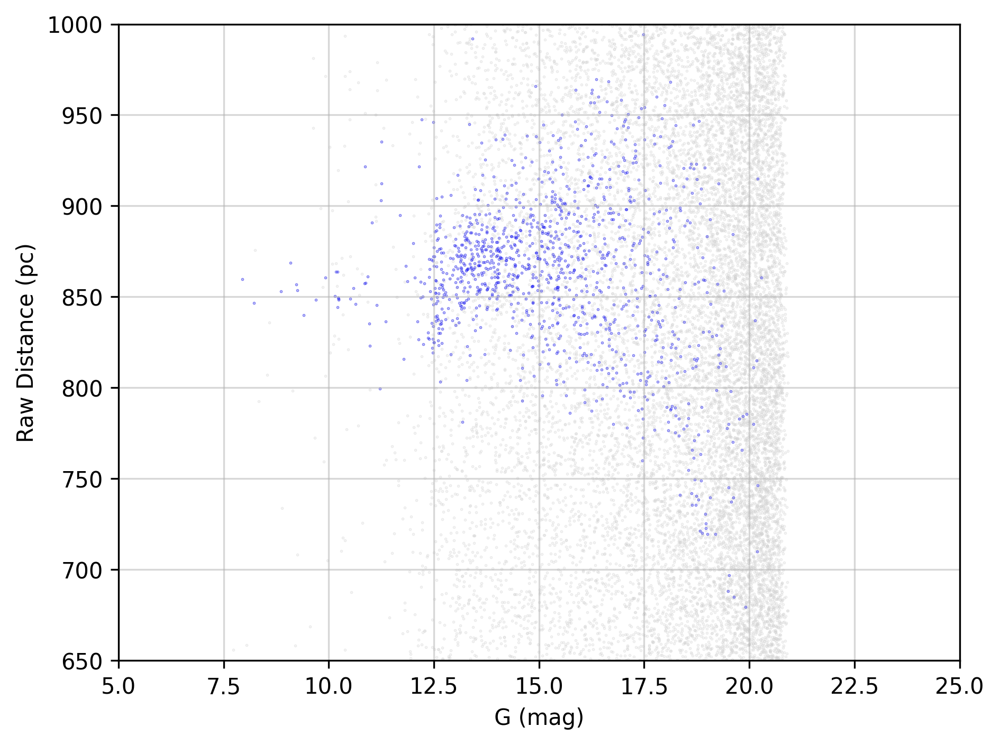

In [19]:
# Raw distance vs. G

plt.figure(dpi=300)

# Defining plot inputs
distance_raw_all = manuel_m67.manuel_distance_raw
g_mag_all = manuel_m67.phot_g_mean_mag
distance_raw_cc = manuel_m67_cluster_candidates.manuel_distance_raw
g_mag_cc = manuel_m67_cluster_candidates.phot_g_mean_mag

# Creating plot
plt.scatter(g_mag_all, distance_raw_all, s=0.1, alpha=0.5, ec="lightgrey", fc="lightgrey")
plt.scatter(g_mag_cc, distance_raw_cc, s=0.1, alpha=0.5, ec="blue", fc="blue")
plt.xlabel("G (mag)")
plt.ylabel("Raw Distance (pc)")
plt.xlim(5, 25)
plt.ylim(650, 1_000)
plt.grid(alpha=0.5)
plt.tight_layout()

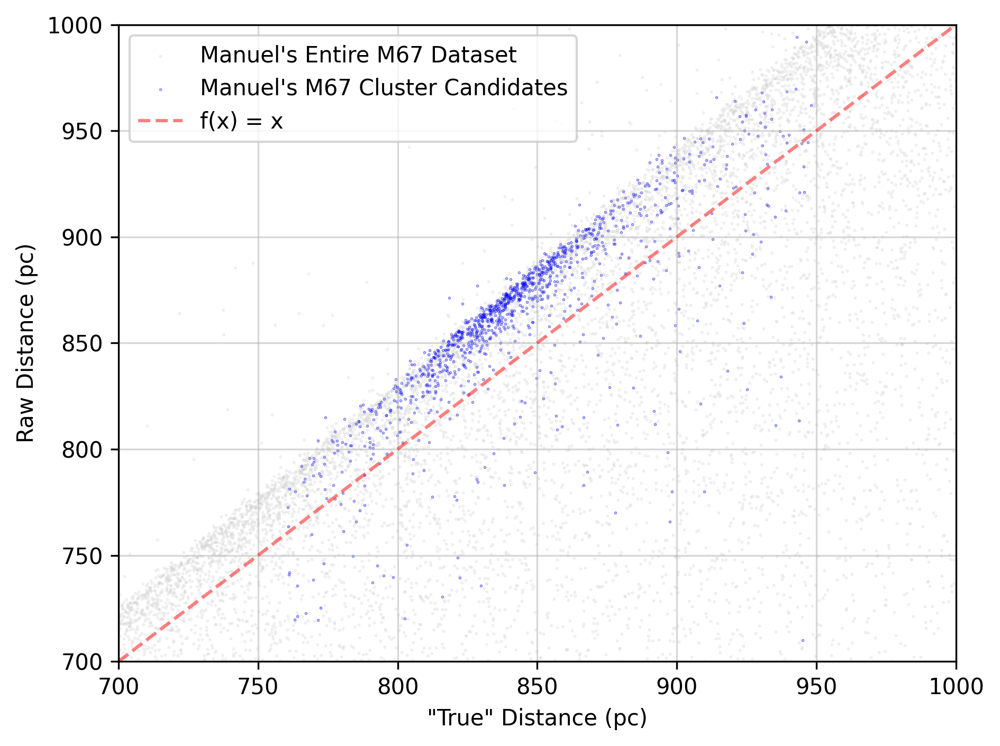

In [20]:
# Raw distance vs R med geo - All
# This is done by Silva's recommendation in the notes doc he sent you


plt.figure(dpi=300)

# Defining plot inputs
distance_raw_all = manuel_m67.manuel_distance_raw
distance_true_all = manuel_m67.r_med_geo
distance_raw_cc = manuel_m67_cluster_candidates.manuel_distance_raw
distance_true_cc = manuel_m67_cluster_candidates.r_med_geo

# First time making a trend line (fits for any data)
# Resource: https://www.geeksforgeeks.org/data-visualization/drawing-scatter-trend-lines-using-matplotlib/
#coeff = np.polyfit(distance_true_all, distance_raw_all, 1)
#poly = np.poly1d(coeff)
#plt.plot(distance_true_all, poly(distance_true_all), c="r", ls="-", alpha=0.5, label="Identity Line [f(x) = x]")

# Creating plot
plt.scatter(distance_true_all, distance_raw_all, s=0.1, alpha=0.5, ec="lightgrey", fc="lightgrey", label="Manuel's Entire M67 Dataset")
plt.scatter(distance_true_cc, distance_raw_cc, s=0.1, alpha=0.5, ec="b", fc="b", label="Manuel's M67 Cluster Candidates")
#plt.xlim(750, 1_000)
#plt.ylim(400, 1_000)

plt.plot([700,1000],[700,1000], alpha=0.5, c="r", ls="--", label="f(x) = x")
plt.xlim(700, 1000)
plt.ylim(700, 1000)

plt.xlabel("\"True\" Distance (pc)")
plt.ylabel("Raw Distance (pc)")
plt.legend()
plt.grid(alpha=0.5)
plt.tight_layout()

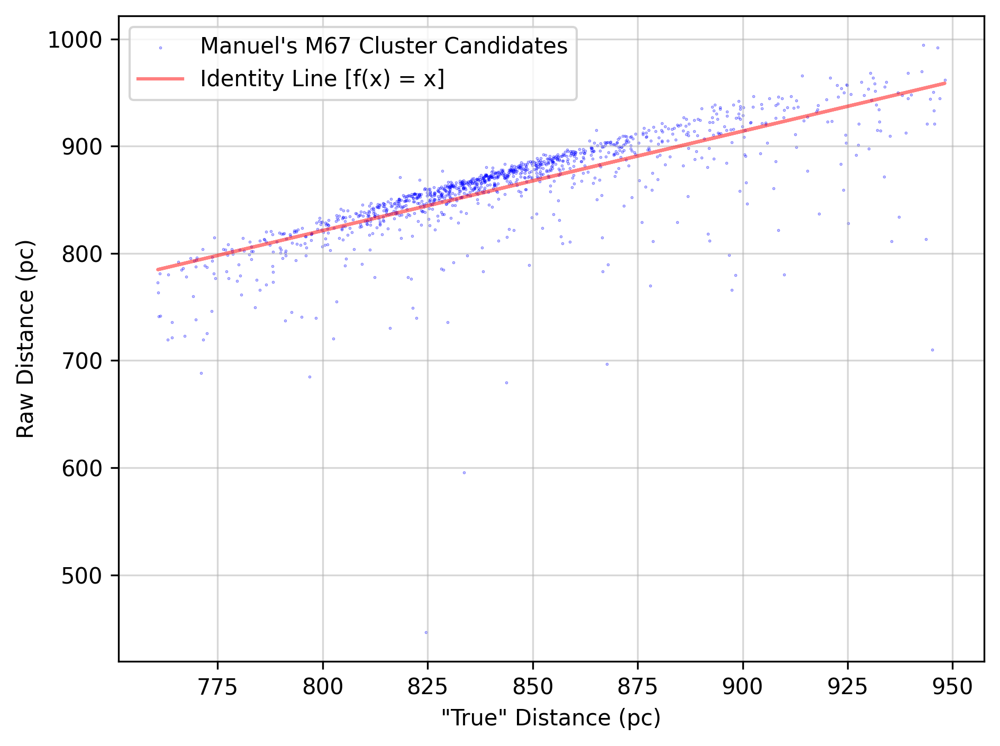

In [21]:
# Raw distance vs R med geo - CC

plt.figure(dpi=300)

# Defining plot inputs
distance_raw = manuel_m67_cluster_candidates.manuel_distance_raw
distance_true = manuel_m67_cluster_candidates.r_med_geo

# First time making a trend line
# Resource: https://www.geeksforgeeks.org/data-visualization/drawing-scatter-trend-lines-using-matplotlib/
coeff = np.polyfit(distance_true, distance_raw, 1)
poly = np.poly1d(coeff)

# Creating plot
plt.scatter(distance_true, distance_raw, s=0.1, alpha=0.5, ec="b", fc="b", label="Manuel's M67 Cluster Candidates")
plt.plot(distance_true, poly(distance_true), c="r", ls="-", alpha=0.5, label="Identity Line [f(x) = x]")
plt.xlabel("\"True\" Distance (pc)")
plt.ylabel("Raw Distance (pc)")
plt.legend()
plt.grid(alpha=0.5)
plt.tight_layout()

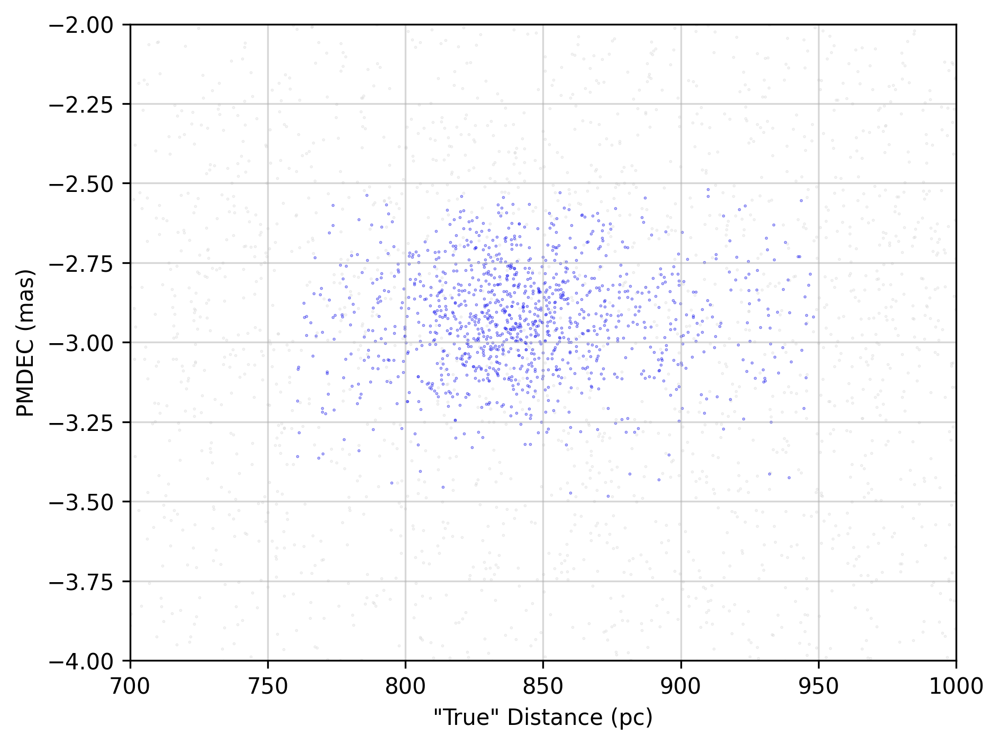

In [22]:
# PMDEC vs R med geo

plt.figure(dpi=300)

# Defining plot inputs
pmdec_all = manuel_m67.pmdec
distance_true_all = manuel_m67.r_med_geo
pmdec_cc = manuel_m67_cluster_candidates.pmdec
distance_true_cc = manuel_m67_cluster_candidates.r_med_geo

# Creating plot
plt.scatter(distance_true_all, pmdec_all, s=0.1, alpha=0.5, ec="lightgrey", fc="lightgrey")
plt.scatter(distance_true_cc, pmdec_cc, s=0.1, alpha=0.5, ec="b", fc="b")
plt.xlabel("\"True\" Distance (pc)")
plt.ylabel("PMDEC (mas)")
plt.xlim(700, 1_000)
plt.ylim(-4, -2)
plt.grid(alpha=0.5)
plt.tight_layout()

# Stellar Velocity

v $\left[ \frac{\text{km}}{\text{s}} \right] = 4.74 \cdot \text{PM [arcs]} \cdot \text{D [pc]}$

In [23]:
# Deriving stellar velocities from the equation above ==> units are [km/s]

pmra = manuel_m67_cluster_candidates.pmra
pmdec = manuel_m67_cluster_candidates.pmdec
D = manuel_m67_cluster_candidates.r_med_geo
vra = vra_calculations(pmra, D)
vdec = vdec_calculations(pmdec, D)
manuel_m67_cluster_candidates = manuel_m67_cluster_candidates.assign(manuel_vra=vra, manuel_vdec=vdec)

pmra = manuel_m67.pmra
pmdec = manuel_m67.pmdec
D = manuel_m67.r_med_geo
vra = vra_calculations(pmra, D)
vdec = vdec_calculations(pmdec, D)
manuel_m67 = manuel_m67.assign(manuel_vra=vra, manuel_vdec=vdec)

manuel_m67_cluster_candidates[["manuel_vra", "manuel_vdec"]]

,manuel_vra,manuel_vdec
6840,-48.760347,-13.609372
10554,-47.320591,-12.649641
16832,-41.059261,-12.019390
16897,-41.843822,-10.225519
17076,-47.382842,-10.958306
...,...,...
114033,-45.788013,-10.683751
114864,-44.595579,-11.838746
115019,-42.614856,-11.616353
115418,-44.141425,-11.438175


In [24]:
pmra = manuel_m67_cluster_candidates.pmra
pmdec = manuel_m67_cluster_candidates.pmdec
D = manuel_m67_cluster_candidates.manuel_distance_raw
vra = vra_calculations(pmra, D)
vdec = vdec_calculations(pmdec, D)
manuel_m67_cluster_candidates = manuel_m67_cluster_candidates.assign(manuel_vra_raw=vra, manuel_vdec_raw=vdec)

pmra = manuel_m67.pmra
pmdec = manuel_m67.pmdec
D = manuel_m67.manuel_distance_raw
vra = vra_calculations(pmra, D)
vdec = vdec_calculations(pmdec, D)
manuel_m67 = manuel_m67.assign(manuel_vra=vra, manuel_vdec=vdec)

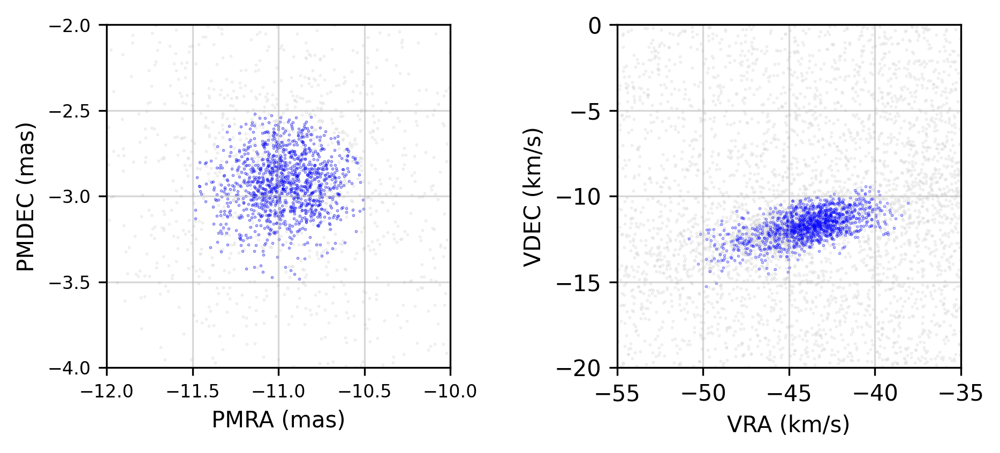

In [25]:
plt.figure(dpi=300)

# Defining plot inputs
pmra_all = manuel_m67.pmra
pmdec_all = manuel_m67.pmdec
vra_all = manuel_m67.manuel_vra
vdec_all = manuel_m67.manuel_vdec

pmra_cc = manuel_m67_cluster_candidates.pmra
pmdec_cc = manuel_m67_cluster_candidates.pmdec
vra_cc = manuel_m67_cluster_candidates.manuel_vra
vdec_cc = manuel_m67_cluster_candidates.manuel_vdec

# PMDEC vs. PMRA (left)
plt.subplot(1, 2, 1)
plt.scatter(pmra_all, pmdec_all, s=0.1, alpha=0.5, ec="lightgrey", fc="lightgrey")
plt.scatter(pmra_cc, pmdec_cc, s=0.1, alpha=0.5, ec="b", fc="b")
plt.xlabel("PMRA (mas)")
plt.ylabel("PMDEC (mas)")
plt.xlim(-12, -10)
plt.ylim(-4, -2)
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)
plt.grid(alpha=0.5)
plt.gca().set_aspect(1)
plt.tight_layout()

# VDEC vs. VRA (right)
plt.subplot(1, 2, 2)
plt.scatter(vra_all, vdec_all, s=0.1, alpha=0.5, ec="lightgrey", fc="lightgrey")
plt.scatter(vra_cc, vdec_cc, s=0.1, alpha=0.5, ec="b", fc="b")
plt.xlabel("VRA (km/s)")
plt.ylabel("VDEC (km/s)")
plt.xlim(-55, -35)
plt.ylim(-20, 0)
plt.grid(alpha=0.5)
plt.gca().set_aspect(1)
plt.tight_layout()

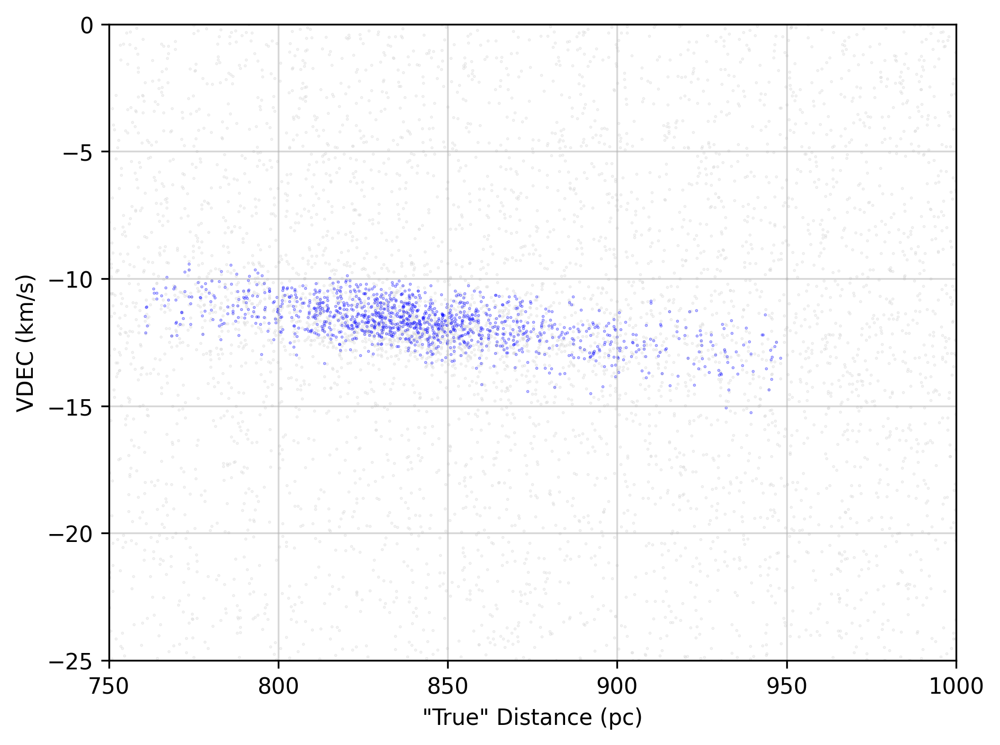

In [26]:
plt.figure(dpi=300)

# Defining plot inputs
vdec_all = manuel_m67.manuel_vdec
distance_true_all = manuel_m67.r_med_geo
vdec_cc = manuel_m67_cluster_candidates.manuel_vdec
distance_true_cc = manuel_m67_cluster_candidates.r_med_geo

# Creating plot
plt.scatter(distance_true_all, vdec_all, s=0.1, alpha=0.5, ec="lightgrey", fc="lightgrey")
plt.scatter(distance_true_cc, vdec_cc, s=0.1, alpha=0.5, ec="b", fc="b")
plt.xlabel("\"True\" Distance (pc)")
plt.ylabel("VDEC (km/s)")
plt.xlim(750, 1_000)
plt.ylim(-25, 0)
plt.grid(alpha=0.5)
plt.tight_layout()

# Color-Magnitude Diagrams (CMDs)

- Asbolute Magnitude Equation: $M_{\text{abs}} = m_{\text{apparent}} - 5 \cdot \log_{10} \left(\frac{D}{10}\right)$, where $M$ and $m$ are in [mag] and $D$ is in [pc].
- Note: We will be using $G$ as our apparent magnitude

In [27]:
manuel_m67

,SOURCE_ID,ra,dec,parallax,pmra,pmdec,ruwe,phot_g_mean_flux,phot_g_mean_mag,phot_g_mean_flux_error,...,distance_gspphot,r_med_geo,r_med_photogeo,flag,fidelity_v2,cluster_flag,rescaled_flux,manuel_distance_raw,manuel_vra,manuel_vdec
1,597267807268920320,132.460820,9.354456,0.673193,-4.467221,11.077062,1.047078,215.068576,19.855925,0.629092,...,NaN,1299.076538,1208.512329,10033,0.989258,0,0.000038,1485.457996,-31.454017,77.994378
2,597267845924725504,132.447898,9.347820,3.808344,-20.515164,5.789698,1.034009,5331.716046,16.370199,2.415111,...,255.674393,259.710754,258.803558,10033,1.000000,0,0.001356,262.581337,-25.533902,7.206064
3,597270693488802944,132.422902,9.353250,2.102317,-11.516026,-1.922608,1.067546,139.350261,20.327097,0.590102,...,NaN,538.822510,1924.507568,10033,0.993164,0,0.000018,475.665710,-25.964671,-4.334820
4,597270762206349824,132.399934,9.357089,0.633316,-5.521866,-9.747638,1.036177,1236.516394,17.956867,1.150160,...,1057.928955,1644.195190,1669.303467,10033,0.965820,0,0.000301,1578.989390,-41.327906,-72.955318
5,597270762206349952,132.413950,9.358508,1.372819,-2.926452,5.010006,1.009970,201.409130,19.927170,0.621971,...,NaN,844.427246,1949.102539,10033,0.966797,0,0.000034,728.428067,-10.104303,17.298293
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115521,607990248958012672,132.286291,12.234218,0.338400,-5.845476,-3.210716,1.026784,184.884382,20.020117,0.775067,...,NaN,1680.500244,1050.966797,10033,0.917480,0,0.000030,2955.078638,-81.878012,-44.972732
115522,607990248958101760,132.283761,12.228874,-1.269681,3.468348,-12.402405,1.000035,105.582835,20.628384,0.687994,...,NaN,2229.045654,7877.241699,20033,0.993652,0,0.000009,-787.599663,-12.948113,46.300935
115523,607990283317791232,132.259641,12.237231,0.307591,1.553191,-4.156176,1.044939,367.272092,19.274897,0.899857,...,NaN,2228.217285,5119.492188,10033,0.968750,0,0.000077,3251.065590,23.934745,-64.046882
115524,607990313381861376,132.273676,12.246604,0.734975,-1.931631,1.440591,1.012051,163.285038,20.155001,0.787233,...,NaN,1570.699341,2914.147217,10033,0.965820,0,0.000024,1360.591090,-12.457476,9.290665


In [28]:
manuel_m67_cluster_candidates

,SOURCE_ID,ra,dec,parallax,pmra,pmdec,ruwe,phot_g_mean_flux,phot_g_mean_mag,phot_g_mean_flux_error,...,r_med_photogeo,flag,fidelity_v2,cluster_flag,rescaled_flux,manuel_distance_raw,manuel_vra,manuel_vdec,manuel_vra_raw,manuel_vdec_raw
6840,597724757429410048,133.852332,9.910795,1.162087,-11.337732,-3.164445,0.971249,144.932767,20.284451,0.586108,...,2767.098145,10033,0.999023,1,0.000020,860.521104,-48.760347,-13.609372,-46.245137,-12.907358
10554,597830722862488064,133.851594,10.549505,1.095713,-11.165605,-2.984766,1.005734,1316.458900,17.888849,1.204375,...,760.558960,10033,0.999512,1,0.000321,912.647951,-47.320591,-12.649641,-48.301864,-12.911952
16832,598458269123799040,132.608282,10.113623,2.239033,-10.505732,-3.075372,1.081544,117.012186,20.516788,0.631274,...,5074.922363,20033,0.957031,1,0.000012,446.621441,-41.059261,-12.019390,-22.240483,-6.510517
16897,598459853967194112,132.706357,10.067045,1.170945,-10.726005,-2.621151,1.016172,12450.085388,15.449436,2.920325,...,823.564697,10033,1.000000,1,0.003190,854.011404,-41.843822,-10.225519,-43.419020,-10.610456
17076,598464900553093504,132.709590,10.198396,1.070715,-10.986817,-2.540939,0.924709,2319.786118,17.273746,1.418730,...,886.014587,10033,1.000000,1,0.000580,933.955126,-47.382842,-10.958306,-48.638060,-11.248603
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
114033,604024585394575616,135.082808,11.718627,1.092838,-11.165367,-2.605223,1.079241,156.722714,20.199537,0.718079,...,2091.405762,10033,0.875977,1,0.000023,915.048950,-45.788013,-10.683751,-48.427903,-11.299718
114864,604404359287255552,135.377416,11.927095,1.203797,-11.369593,-3.018275,0.947422,518.951913,18.899549,1.074042,...,721.773193,10033,0.999512,1,0.000116,830.704700,-44.595579,-11.838746,-44.768230,-11.884580
115019,604417828304774912,135.277368,12.018711,1.247194,-11.482671,-3.130053,0.982878,4696.161260,16.508009,2.291627,...,791.586792,10033,1.000000,1,0.001192,801.800134,-42.614856,-11.616353,-43.640267,-11.895869
115418,607987427163771520,132.122303,12.109806,1.122718,-10.852459,-2.812150,0.911993,85856.495664,13.352934,15.149278,...,856.543884,10033,1.000000,1,0.022102,890.695997,-44.141425,-11.438175,-45.817985,-11.872615


In [29]:
# Calculating MG just for the cluster candidates

g_mag = manuel_m67_cluster_candidates.phot_g_mean_mag
D = manuel_m67_cluster_candidates.r_med_geo
MG = MG_calculations(g_mag, D)
manuel_m67_cluster_candidates = manuel_m67_cluster_candidates.assign(manuel_MG=MG)
manuel_m67_cluster_candidates[["manuel_MG"]]

,manuel_MG
6840,10.495640
10554,8.131902
16832,10.935756
16897,5.872361
17076,7.478892
...,...
114033,10.514035
114864,9.310706
115019,7.039310
115418,3.685234


In [30]:
# Calculating MG for the entire MC dataset

g_mag = manuel_m67.phot_g_mean_mag
D = manuel_m67.r_med_geo
MG = MG_calculations(g_mag, D)
manuel_m67 = manuel_m67.assign(manuel_MG=MG)
manuel_m67[["manuel_MG"]]

,manuel_MG
1,9.287750
2,9.297750
3,11.669868
4,6.877100
5,10.294359
...,...
115521,8.892923
115522,8.887789
115523,7.535109
115524,9.174536


In [31]:
# Making a raw MG for MC

g_mag = manuel_m67_cluster_candidates.phot_g_mean_mag
D = manuel_m67_cluster_candidates.manuel_distance_raw
MG = MG_calculations(g_mag, D)
manuel_m67_cluster_candidates = manuel_m67_cluster_candidates.assign(manuel_MG_raw=MG)

g_mag = manuel_m67.phot_g_mean_mag
D = manuel_m67.manuel_distance_raw
MG = MG_calculations(g_mag, D)
manuel_m67 = manuel_m67.assign(manuel_MG_raw=MG)
manuel_m67[["manuel_MG_raw"]]

/data0/sw/anaconda3/lib/python3.10/site-packages/pandas/core/arraylike.py:396: RuntimeWarning: invalid value encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


,manuel_MG_raw
1,8.996623
2,9.273880
3,11.940588
4,6.964971
5,10.615236
...,...
115521,7.667272
115522,NaN
115523,6.714768
115524,9.486363


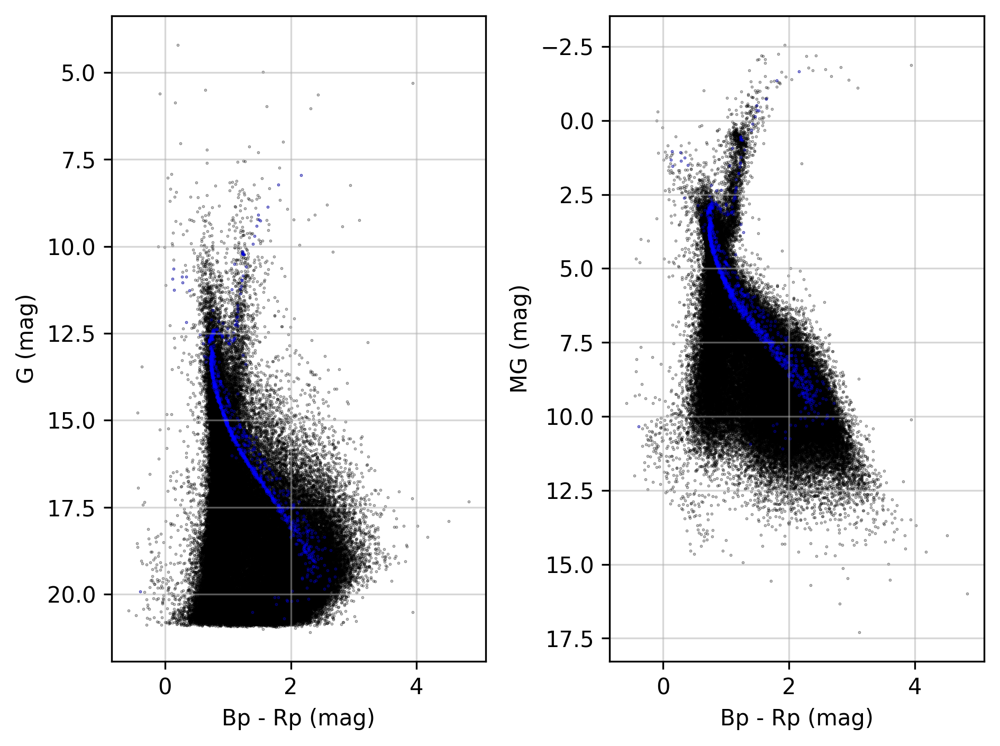

In [32]:
# G vs. Bp-Rp and MG vs. Bp-Rp
# Entire MC dataset, cluster candidates highlighted blue

plt.figure(dpi=300)

# Defining plot inputs
g_mag_all = manuel_m67.phot_g_mean_mag
g_mag_candidates = manuel_m67_cluster_candidates.phot_g_mean_mag
bp_rp_all = manuel_m67.bp_rp
bp_rp_candidates = manuel_m67_cluster_candidates.bp_rp
mg_all = manuel_m67.manuel_MG
mg_candidates = manuel_m67_cluster_candidates.manuel_MG

# G vs. Bp-Rp (left)
plt.subplot(1, 2, 1)
plt.scatter(bp_rp_all, g_mag_all, s=0.1, alpha=0.5, ec="0", fc="0")
plt.scatter(bp_rp_candidates, g_mag_candidates, s=0.1, alpha=0.5, ec="b", fc="b")
plt.xlabel("Bp - Rp (mag)")
plt.ylabel("G (mag)")
plt.grid(alpha=0.5)
plt.gca().invert_yaxis()
plt.tight_layout()

# MG vs. Bp-Rp (right)
plt.subplot(1, 2, 2)
plt.scatter(bp_rp_all, mg_all, s=0.1, alpha=0.5, ec="0", fc="0")
plt.scatter(bp_rp_candidates, mg_candidates, s=0.1, alpha=0.5, ec="b", fc="b")
plt.xlabel("Bp - Rp (mag)")
plt.ylabel("MG (mag)")
plt.grid(alpha=0.5)
plt.gca().invert_yaxis()
plt.tight_layout()

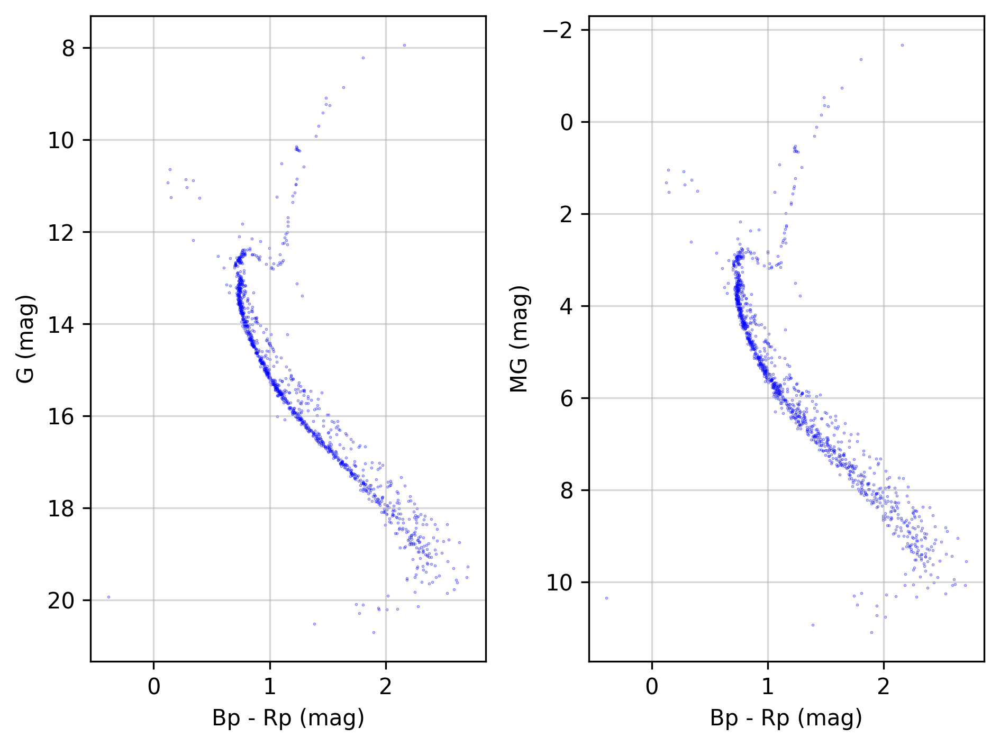

In [33]:
# Just the cluster candidates

plt.figure(dpi=300)

# Defining plot inputs
g_mag_candidates = manuel_m67_cluster_candidates.phot_g_mean_mag
bp_rp_candidates = manuel_m67_cluster_candidates.bp_rp
mg_candidates = manuel_m67_cluster_candidates.manuel_MG

# G vs. Bp-Rp (left)
plt.subplot(1, 2, 1)
plt.scatter(bp_rp_candidates, g_mag_candidates, s=0.1, alpha=0.5, ec="b", fc="b")
plt.xlabel("Bp - Rp (mag)")
plt.ylabel("G (mag)")
plt.gca().invert_yaxis()
plt.grid(alpha=0.5)
plt.tight_layout()

# MG vs. Bp-Rp (right)
plt.subplot(1, 2, 2)
plt.scatter(bp_rp_candidates, mg_candidates, s=0.1, alpha=0.5, ec="b", fc="b")
plt.xlabel("Bp - Rp (mag)")
plt.ylabel("MG (mag)")
plt.gca().invert_yaxis()
plt.grid(alpha=0.5)
plt.tight_layout()

# Matching MC & HR2

## Joins

In [34]:
# Importing astropy modules for read the HR2 FITS file

from astropy.io import fits
from astropy.table import Table

In [35]:
pwd

'/home/jail/dlusers/ricardo_vega/Silva_OC_Project/Data_Exercises-Projects/Project_4'

In [36]:
# Entire HR2 member catalogue

all_catalogue = Table.read("/home/jail/dlusers/ricardo_vega/Silva_OC_Project/Data_Exercises-Projects/Project_4/Imported Files/asu_all_members.fit")
hr2_all = all_catalogue.to_pandas()
hr2_all

,recno,Name,ID,GaiaDR3,inrt,Prob,RA_ICRS,e_RA_ICRS,DE_ICRS,e_DE_ICRS,...,e_GRVSmag,o_GRVSmag,Vbroad,e_Vbroad,o_Vbroad,VarFlag,NSS,RVS,_RA_icrs,_DE_icrs
0,1,b'1636-283 ',0,6032349260227596544,0,0.747692,249.708525,0.201080,-28.585117,0.115789,...,0.000000,0.0,0.00000,0.000000,0.0,b'NOT_AVAILABLE',0,0,249.708532,-28.585090
1,2,b'1636-283 ',0,6032358331198284160,1,1.000000,249.866424,0.020684,-28.402037,0.013691,...,0.000000,0.0,0.00000,0.000000,0.0,b'NOT_AVAILABLE',0,0,249.866431,-28.402009
2,3,b'1636-283 ',0,6032358331198285696,1,0.843798,249.865221,0.046356,-28.399406,0.029595,...,0.000000,0.0,0.00000,0.000000,0.0,b'NOT_AVAILABLE',0,0,249.865229,-28.399378
3,4,b'1636-283 ',0,6032358331198286080,1,1.000000,249.861159,0.045101,-28.400698,0.030237,...,0.000000,0.0,0.00000,0.000000,0.0,b'NOT_AVAILABLE',0,0,249.861167,-28.400669
4,5,b'1636-283 ',0,6032358670488486784,1,1.000000,249.939480,0.038724,-28.429366,0.023344,...,0.000000,0.0,0.00000,0.000000,0.0,b'NOT_AVAILABLE',0,0,249.939488,-28.429337
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1291924,1291925,b'vdBergh_92 ',7163,3045840104515988992,1,1.000000,106.116546,0.110176,-11.474387,0.111851,...,0.000000,0.0,0.00000,0.000000,0.0,b'NOT_AVAILABLE',0,0,106.116566,-11.474394
1291925,1291926,b'vdBergh_92 ',7163,3045840074455065088,1,0.838193,106.136236,0.049847,-11.471452,0.049169,...,0.000000,0.0,0.00000,0.000000,0.0,b'NOT_AVAILABLE',0,0,106.136255,-11.471459
1291926,1291927,b'vdBergh_92 ',7163,3045840074453671680,1,0.639341,106.135606,0.056229,-11.468653,0.058581,...,0.000000,0.0,0.00000,0.000000,0.0,b'VARIABLE ',0,0,106.135625,-11.468660
1291927,1291928,b'vdBergh_92 ',7163,3045840654267074048,1,0.738133,106.159649,0.058318,-11.436082,0.062037,...,0.000000,0.0,0.00000,0.000000,0.0,b'NOT_AVAILABLE',0,0,106.159667,-11.436089


In [37]:
# Just HR2's M67 cluster

hr2_m67 = hr2_all[hr2_all["Name"] == b'NGC_2682            ']
hr2_m67["Name"] = "NGC_2682"
hr2_m67

/tmp/ipykernel_1425824/4070065004.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hr2_m67["Name"] = "NGC_2682"


,recno,Name,ID,GaiaDR3,inrt,Prob,RA_ICRS,e_RA_ICRS,DE_ICRS,e_DE_ICRS,...,e_GRVSmag,o_GRVSmag,Vbroad,e_Vbroad,o_Vbroad,VarFlag,NSS,RVS,_RA_icrs,_DE_icrs
443016,443017,NGC_2682,4606,604931815630738688,0,0.367301,133.228754,0.232885,11.913885,0.120769,...,0.000000,0.0,0.0,0.0,0.0,b'NOT_AVAILABLE',0,0,133.228806,11.913896
443017,443018,NGC_2682,4606,604931819926896384,0,0.471618,133.229893,0.042849,11.916881,0.021172,...,0.000000,0.0,0.0,0.0,0.0,b'NOT_AVAILABLE',0,0,133.229941,11.916894
443018,443019,NGC_2682,4606,604933228676166656,0,0.376948,133.232291,0.076711,11.962825,0.037108,...,0.000000,0.0,0.0,0.0,0.0,b'NOT_AVAILABLE',0,0,133.232344,11.962838
443019,443020,NGC_2682,4606,604933018221557120,1,0.570397,133.198521,0.021742,11.957266,0.011263,...,0.059627,20.0,0.0,0.0,0.0,b'NOT_AVAILABLE',0,0,133.198572,11.957279
443020,443021,NGC_2682,4606,604932404042610176,1,0.605382,133.247746,0.035353,11.947294,0.016888,...,0.000000,0.0,0.0,0.0,0.0,b'NOT_AVAILABLE',0,0,133.247796,11.947308
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
444855,444856,NGC_2682,4606,604904881892076032,1,0.679668,132.968238,0.113929,11.764310,0.062545,...,0.000000,0.0,0.0,0.0,0.0,b'NOT_AVAILABLE',0,0,132.968287,11.764324
444856,444857,NGC_2682,4606,604904847532342528,1,0.608151,132.959196,0.021412,11.749179,0.011199,...,0.105967,9.0,0.0,0.0,0.0,b'NOT_AVAILABLE',1,0,132.959245,11.749193
444857,444858,NGC_2682,4606,604904847532342272,1,0.611402,132.958782,0.015714,11.750083,0.007814,...,0.054685,7.0,0.0,0.0,0.0,b'NOT_AVAILABLE',0,0,132.958833,11.750097
444858,444859,NGC_2682,4606,604904813174193536,0,0.294074,132.999164,0.340754,11.762115,0.183976,...,0.000000,0.0,0.0,0.0,0.0,b'NOT_AVAILABLE',0,0,132.999213,11.762125


In [38]:
# Calculating raw distance and MG for HR2's M67 (used later for plots)

parallax = hr2_m67.Plx
distance_raw = distance_raw_calculations(parallax)
hr2_m67 = hr2_m67.assign(hr2_distance_raw=distance_raw)

g_mag = hr2_m67.Gmag
D = hr2_m67.hr2_distance_raw
MG = MG_calculations(g_mag, D)
hr2_m67 = hr2_m67.assign(hr2_MG=MG)

hr2_m67[["Plx", "hr2_distance_raw", "hr2_MG"]]

,Plx,hr2_distance_raw,hr2_MG
443016,1.2090,827.129859,9.522339
443017,1.1890,841.042893,6.447566
443018,1.1750,851.063830,6.463659
443019,1.1030,906.618314,4.843992
443020,1.1190,893.655049,5.780527
...,...,...,...
444855,1.2160,822.368421,8.368239
444856,1.0580,945.179584,3.459505
444857,1.0700,934.579439,3.777443
444858,0.8825,1133.144476,9.395034


In [39]:
# Creating copies for the joins to prevent any possible dataframe manipulation carrying over

manuel_copy = manuel_m67_cluster_candidates.copy()
hr2_copy = hr2_m67.copy()

### Common Stars

In [40]:
# Matching stars in both datasets
# len = 1134 total common stars in the datasets

common_stars = hr2_copy.merge(manuel_copy, how="inner", left_on="GaiaDR3", right_on="SOURCE_ID")
common_stars

,recno,Name,ID,GaiaDR3,inrt,Prob,RA_ICRS,e_RA_ICRS,DE_ICRS,e_DE_ICRS,...,fidelity_v2,cluster_flag,rescaled_flux,manuel_distance_raw,manuel_vra,manuel_vdec,manuel_vra_raw,manuel_vdec_raw,manuel_MG,manuel_MG_raw
0,443018,NGC_2682,4606,604931819926896384,0,0.471618,133.229893,0.042849,11.916881,0.021172,...,1.0,1,0.001791,840.745597,-41.427220,-11.302478,-42.719989,-11.655180,6.515060,6.448334
1,443020,NGC_2682,4606,604933018221557120,1,0.570397,133.198521,0.021742,11.957266,0.011263,...,1.0,1,0.006798,906.509080,-46.336011,-11.667121,-48.260893,-12.151794,4.932636,4.844253
2,443021,NGC_2682,4606,604932404042610176,1,0.605382,133.247746,0.035353,11.947294,0.016888,...,1.0,1,0.002943,893.275980,-44.768150,-12.056987,-46.378508,-12.490690,5.858187,5.781449
3,443025,NGC_2682,4606,604933125596954240,1,0.607795,133.197591,0.025558,11.969062,0.012012,...,1.0,1,0.005941,884.101951,-44.808811,-10.916996,-46.406622,-11.306279,5.120626,5.044544
4,443027,NGC_2682,4606,604930754775030400,1,0.565926,133.082196,0.035280,11.872999,0.018395,...,1.0,1,0.002222,839.807966,-40.807700,-11.929910,-42.520061,-12.430510,6.307758,6.218499
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1129,444853,NGC_2682,4606,604905019331023104,1,0.601979,132.986384,0.044853,11.781827,0.022784,...,1.0,1,0.001572,915.826576,-48.005138,-12.586535,-48.967097,-12.838753,6.445526,6.402443
1130,444855,NGC_2682,4606,604904950611554432,1,0.978113,132.959127,0.021849,11.768576,0.010914,...,1.0,1,0.302581,848.807720,-43.409021,-11.361575,-44.736481,-11.709016,0.934099,0.868690
1131,444856,NGC_2682,4606,604904881892076032,1,0.679668,132.968238,0.113929,11.764310,0.062545,...,1.0,1,0.000305,822.167002,-42.219602,-12.231884,-41.983892,-12.163594,8.356613,8.368771
1132,444857,NGC_2682,4606,604904847532342528,1,0.608151,132.959196,0.021412,11.749179,0.011199,...,1.0,1,0.022428,944.753757,-46.378292,-12.782046,-48.344855,-13.324039,3.550661,3.460484


In [41]:
# Checking to see if the IDs now match up

common_stars[["Name", "GaiaDR3", "SOURCE_ID"]]

,Name,GaiaDR3,SOURCE_ID
0,NGC_2682,604931819926896384,604931819926896384
1,NGC_2682,604933018221557120,604933018221557120
2,NGC_2682,604932404042610176,604932404042610176
3,NGC_2682,604933125596954240,604933125596954240
4,NGC_2682,604930754775030400,604930754775030400
...,...,...,...
1129,NGC_2682,604905019331023104,604905019331023104
1130,NGC_2682,604904950611554432,604904950611554432
1131,NGC_2682,604904881892076032,604904881892076032
1132,NGC_2682,604904847532342528,604904847532342528


In [42]:
# Confirming that each value in the ID columns are the same
# Since they all match, the common_stars dataframe is the collection are stars that are in both datasets

(common_stars["GaiaDR3"] == common_stars["SOURCE_ID"]).value_counts()

True    1134
Name: count, dtype: int64

### In MC, not HR2

In [43]:
# Stars that are in MC, but not HR2

mc_not_in_hr2 = hr2_copy.merge(manuel_copy, how="right", left_on="GaiaDR3", right_on="SOURCE_ID")
mc_not_in_hr2

,recno,Name,ID,GaiaDR3,inrt,Prob,RA_ICRS,e_RA_ICRS,DE_ICRS,e_DE_ICRS,...,fidelity_v2,cluster_flag,rescaled_flux,manuel_distance_raw,manuel_vra,manuel_vdec,manuel_vra_raw,manuel_vdec_raw,manuel_MG,manuel_MG_raw
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.999023,1,0.000020,860.521104,-48.760347,-13.609372,-46.245137,-12.907358,10.495640,10.610643
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.999512,1,0.000321,912.647951,-47.320591,-12.649641,-48.301864,-12.911952,8.131902,8.087333
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.957031,1,0.000012,446.621441,-41.059261,-12.019390,-22.240483,-6.510517,10.935756,12.267091
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.000000,1,0.003190,854.011404,-41.843822,-10.225519,-43.419020,-10.610456,5.872361,5.792118
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.000000,1,0.000580,933.955126,-47.382842,-10.958306,-48.638060,-11.248603,7.478892,7.422116
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1155,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.875977,1,0.000023,915.048950,-45.788013,-10.683751,-48.427903,-11.299718,10.514035,10.392316
1156,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.999512,1,0.000116,830.704700,-44.595579,-11.838746,-44.768230,-11.884580,9.310706,9.302316
1157,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.000000,1,0.001192,801.800134,-42.614856,-11.616353,-43.640267,-11.895869,7.039310,6.987678
1158,443694.0,NGC_2682,4606.0,6.079874e+17,0.0,0.327828,132.122303,0.014066,12.109806,0.007508,...,1.000000,1,0.022102,890.695997,-44.141425,-11.438175,-45.817985,-11.872615,3.685234,3.604286


In [44]:
# Checking if there are any IDs that are still matching

mc_not_in_hr2[["Name", "GaiaDR3", "SOURCE_ID"]]

,Name,GaiaDR3,SOURCE_ID
0,NaN,NaN,597724757429410048
1,NaN,NaN,597830722862488064
2,NaN,NaN,598458269123799040
3,NaN,NaN,598459853967194112
4,NaN,NaN,598464900553093504
...,...,...,...
1155,NaN,NaN,604024585394575616
1156,NaN,NaN,604404359287255552
1157,NaN,NaN,604417828304774912
1158,NGC_2682,6.079874e+17,607987427163771520


In [45]:
# The True (26) counts are the stars we will isolate
# These are the actual stars that are in MC and not in HR2

(mc_not_in_hr2["SOURCE_ID"] != mc_not_in_hr2["GaiaDR3"]).value_counts()

False    1134
True       26
Name: count, dtype: int64

In [46]:
# Stars and count of stars in MC, not in HR2; len = 26

stars_in_mc_not_in_hr2 = mc_not_in_hr2.loc[mc_not_in_hr2.index[mc_not_in_hr2["SOURCE_ID"] != mc_not_in_hr2["GaiaDR3"]]]
stars_in_mc_not_in_hr2

,recno,Name,ID,GaiaDR3,inrt,Prob,RA_ICRS,e_RA_ICRS,DE_ICRS,e_DE_ICRS,...,fidelity_v2,cluster_flag,rescaled_flux,manuel_distance_raw,manuel_vra,manuel_vdec,manuel_vra_raw,manuel_vdec_raw,manuel_MG,manuel_MG_raw
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.999023,1,0.000020,860.521104,-48.760347,-13.609372,-46.245137,-12.907358,10.495640,10.610643
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.999512,1,0.000321,912.647951,-47.320591,-12.649641,-48.301864,-12.911952,8.131902,8.087333
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.957031,1,0.000012,446.621441,-41.059261,-12.019390,-22.240483,-6.510517,10.935756,12.267091
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.000000,1,0.003190,854.011404,-41.843822,-10.225519,-43.419020,-10.610456,5.872361,5.792118
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.000000,1,0.000580,933.955126,-47.382842,-10.958306,-48.638060,-11.248603,7.478892,7.422116
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.000000,1,0.002508,877.475806,-44.256793,-11.374749,-45.783501,-11.767139,6.066310,5.992665
22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.878906,1,0.000736,868.565175,-41.644366,-11.469222,-43.943738,-12.102489,7.443905,7.327201
42,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.000000,1,0.001726,865.352080,-42.494956,-12.477097,-43.733334,-12.840702,6.487703,6.425328
73,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.951660,1,0.000008,595.460021,-41.516193,-11.941211,-29.655724,-8.529810,11.088624,11.819169
143,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.000000,1,0.017502,833.160551,-42.391698,-12.516846,-43.958510,-12.979473,4.081242,4.002431


In [47]:
# The SOURCE_ID of stars in MC data, but not in HR2

source_ids = stars_in_mc_not_in_hr2[["SOURCE_ID"]]
source_ids

,SOURCE_ID
0,597724757429410048
1,597830722862488064
2,598458269123799040
3,598459853967194112
4,598464900553093504
5,598563173700539520
22,598686731319744768
42,598811491529406080
73,598893538291771264
143,601847518011947392


### In HR2, not MC

In [48]:
# Stars that are in HR2, but not MC

hr2_not_in_mc = hr2_copy.merge(manuel_copy, how="left", left_on="GaiaDR3", right_on="SOURCE_ID")
hr2_not_in_mc

,recno,Name,ID,GaiaDR3,inrt,Prob,RA_ICRS,e_RA_ICRS,DE_ICRS,e_DE_ICRS,...,fidelity_v2,cluster_flag,rescaled_flux,manuel_distance_raw,manuel_vra,manuel_vdec,manuel_vra_raw,manuel_vdec_raw,manuel_MG,manuel_MG_raw
0,443017,NGC_2682,4606,604931815630738688,0,0.367301,133.228754,0.232885,11.913885,0.120769,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,443018,NGC_2682,4606,604931819926896384,0,0.471618,133.229893,0.042849,11.916881,0.021172,...,1.0,1.0,0.001791,840.745597,-41.427220,-11.302478,-42.719989,-11.655180,6.515060,6.448334
2,443019,NGC_2682,4606,604933228676166656,0,0.376948,133.232291,0.076711,11.962825,0.037108,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,443020,NGC_2682,4606,604933018221557120,1,0.570397,133.198521,0.021742,11.957266,0.011263,...,1.0,1.0,0.006798,906.509080,-46.336011,-11.667121,-48.260893,-12.151794,4.932636,4.844253
4,443021,NGC_2682,4606,604932404042610176,1,0.605382,133.247746,0.035353,11.947294,0.016888,...,1.0,1.0,0.002943,893.275980,-44.768150,-12.056987,-46.378508,-12.490690,5.858187,5.781449
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1839,444856,NGC_2682,4606,604904881892076032,1,0.679668,132.968238,0.113929,11.764310,0.062545,...,1.0,1.0,0.000305,822.167002,-42.219602,-12.231884,-41.983892,-12.163594,8.356613,8.368771
1840,444857,NGC_2682,4606,604904847532342528,1,0.608151,132.959196,0.021412,11.749179,0.011199,...,1.0,1.0,0.022428,944.753757,-46.378292,-12.782046,-48.344855,-13.324039,3.550661,3.460484
1841,444858,NGC_2682,4606,604904847532342272,1,0.611402,132.958782,0.015714,11.750083,0.007814,...,1.0,1.0,0.017112,934.832368,-47.376271,-13.378912,-49.241802,-13.905732,3.860721,3.776855
1842,444859,NGC_2682,4606,604904813174193536,0,0.294074,132.999164,0.340754,11.762115,0.183976,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [49]:
# Checking if there are any IDs that are still matching

hr2_not_in_mc[["Name", "GaiaDR3", "SOURCE_ID"]]

,Name,GaiaDR3,SOURCE_ID
0,NGC_2682,604931815630738688,NaN
1,NGC_2682,604931819926896384,6.049318e+17
2,NGC_2682,604933228676166656,NaN
3,NGC_2682,604933018221557120,6.049330e+17
4,NGC_2682,604932404042610176,6.049324e+17
...,...,...,...
1839,NGC_2682,604904881892076032,6.049049e+17
1840,NGC_2682,604904847532342528,6.049048e+17
1841,NGC_2682,604904847532342272,6.049048e+17
1842,NGC_2682,604904813174193536,NaN


In [50]:
# Stars and count of stars in HR2, not in MC; len = 710

stars_in_hr2_not_in_mc = hr2_not_in_mc.loc[hr2_not_in_mc.index[hr2_not_in_mc["SOURCE_ID"] != hr2_not_in_mc["GaiaDR3"]]]
stars_in_hr2_not_in_mc

,recno,Name,ID,GaiaDR3,inrt,Prob,RA_ICRS,e_RA_ICRS,DE_ICRS,e_DE_ICRS,...,fidelity_v2,cluster_flag,rescaled_flux,manuel_distance_raw,manuel_vra,manuel_vdec,manuel_vra_raw,manuel_vdec_raw,manuel_MG,manuel_MG_raw
0,443017,NGC_2682,4606,604931815630738688,0,0.367301,133.228754,0.232885,11.913885,0.120769,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,443019,NGC_2682,4606,604933228676166656,0,0.376948,133.232291,0.076711,11.962825,0.037108,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,443022,NGC_2682,4606,604932988158004352,0,0.276037,133.174532,0.429873,11.951223,0.233769,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,443023,NGC_2682,4606,604933121300811520,0,0.247381,133.201671,0.124318,11.979014,0.065778,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,443024,NGC_2682,4606,604931472033361280,0,0.176246,133.161187,0.314205,11.942171,0.170505,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1833,444850,NGC_2682,4606,604905122410226688,0,0.374923,133.068066,0.050457,11.737014,0.024027,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1835,444852,NGC_2682,4606,604905053690765184,0,0.299053,132.974044,0.047755,11.776273,0.024617,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1837,444854,NGC_2682,4606,604905015035445504,1,0.633262,132.981885,0.123613,11.778627,0.064424,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1842,444859,NGC_2682,4606,604904813174193536,0,0.294074,132.999164,0.340754,11.762115,0.183976,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [51]:
# The GaiaDR3 IDs of stars in HR2 data, but not in MC

gaia_dr3_ids = stars_in_hr2_not_in_mc[["GaiaDR3"]]
gaia_dr3_ids

,GaiaDR3
0,604931815630738688
2,604933228676166656
5,604932988158004352
6,604933121300811520
7,604931472033361280
...,...
1833,604905122410226688
1835,604905053690765184
1837,604905015035445504
1842,604904813174193536


## Plots
- For all figures, plot `MG` vs. `Bp - Rp` 

In [52]:
# Seems like the Gmag column for HR2 dataset is the apparent magnitude

common_stars[["Gmag", "phot_g_mean_mag"]]

,Gmag,phot_g_mean_mag
0,16.071657,16.071657
1,14.631114,14.631114
2,15.536377,15.536377
3,14.777056,14.777056
4,15.839399,15.839399
...,...,...
1129,16.211510,16.211510
1130,10.512736,10.512736
1131,17.943571,17.943571
1132,13.337077,13.337077


### Just MC Cluster Candidates (`cluster_flag` == 1)

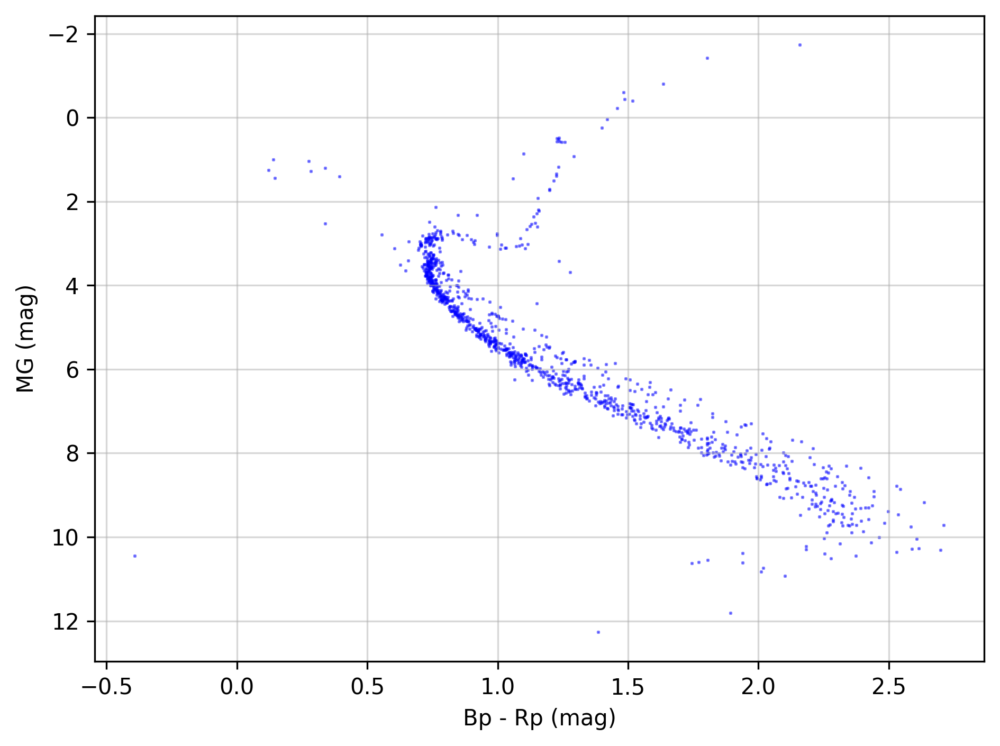

In [53]:
plt.figure(dpi=300)

# Defining plot inputs
bp_rp_candidates = manuel_m67_cluster_candidates.bp_rp
mg_candidates = manuel_m67_cluster_candidates.manuel_MG_raw # This is with the raw MG to compare to HR2

# Creating plot
plt.scatter(bp_rp_candidates, mg_candidates, s=0.1, alpha=0.5, marker="s", ec="b", fc="b")
plt.xlabel("Bp - Rp (mag)")
plt.ylabel("MG (mag)")
plt.gca().invert_yaxis()
plt.grid(alpha=0.5)
plt.tight_layout()

### Just HR2's M67

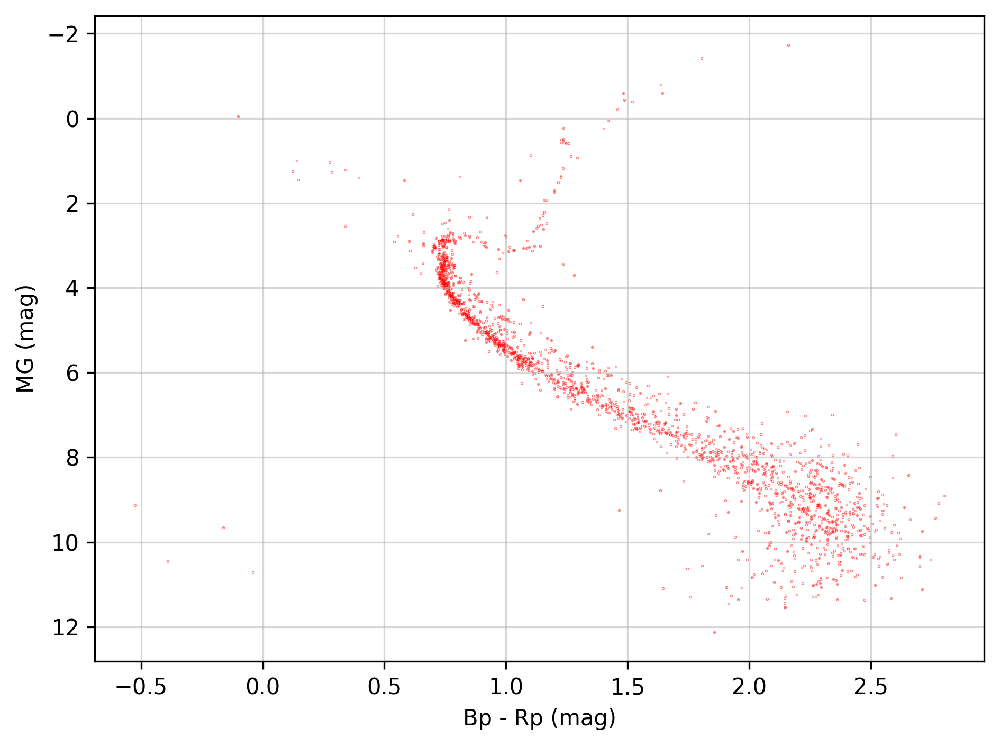

In [54]:
plt.figure(dpi=300)

# Defining plot inputs
bp_rp_hr2_m67 = hr2_m67["BP-RP"]
mg_hr2_m67 = hr2_m67["hr2_MG"]

# Creating plot
plt.scatter(bp_rp_hr2_m67, mg_hr2_m67, s=0.1, alpha=0.5, ec="r", fc="r")
plt.xlabel("Bp - Rp (mag)")
plt.ylabel("MG (mag)")
plt.gca().invert_yaxis()
plt.grid(alpha=0.5)
plt.tight_layout()

### Common Stars

In [55]:
common_stars

,recno,Name,ID,GaiaDR3,inrt,Prob,RA_ICRS,e_RA_ICRS,DE_ICRS,e_DE_ICRS,...,fidelity_v2,cluster_flag,rescaled_flux,manuel_distance_raw,manuel_vra,manuel_vdec,manuel_vra_raw,manuel_vdec_raw,manuel_MG,manuel_MG_raw
0,443018,NGC_2682,4606,604931819926896384,0,0.471618,133.229893,0.042849,11.916881,0.021172,...,1.0,1,0.001791,840.745597,-41.427220,-11.302478,-42.719989,-11.655180,6.515060,6.448334
1,443020,NGC_2682,4606,604933018221557120,1,0.570397,133.198521,0.021742,11.957266,0.011263,...,1.0,1,0.006798,906.509080,-46.336011,-11.667121,-48.260893,-12.151794,4.932636,4.844253
2,443021,NGC_2682,4606,604932404042610176,1,0.605382,133.247746,0.035353,11.947294,0.016888,...,1.0,1,0.002943,893.275980,-44.768150,-12.056987,-46.378508,-12.490690,5.858187,5.781449
3,443025,NGC_2682,4606,604933125596954240,1,0.607795,133.197591,0.025558,11.969062,0.012012,...,1.0,1,0.005941,884.101951,-44.808811,-10.916996,-46.406622,-11.306279,5.120626,5.044544
4,443027,NGC_2682,4606,604930754775030400,1,0.565926,133.082196,0.035280,11.872999,0.018395,...,1.0,1,0.002222,839.807966,-40.807700,-11.929910,-42.520061,-12.430510,6.307758,6.218499
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1129,444853,NGC_2682,4606,604905019331023104,1,0.601979,132.986384,0.044853,11.781827,0.022784,...,1.0,1,0.001572,915.826576,-48.005138,-12.586535,-48.967097,-12.838753,6.445526,6.402443
1130,444855,NGC_2682,4606,604904950611554432,1,0.978113,132.959127,0.021849,11.768576,0.010914,...,1.0,1,0.302581,848.807720,-43.409021,-11.361575,-44.736481,-11.709016,0.934099,0.868690
1131,444856,NGC_2682,4606,604904881892076032,1,0.679668,132.968238,0.113929,11.764310,0.062545,...,1.0,1,0.000305,822.167002,-42.219602,-12.231884,-41.983892,-12.163594,8.356613,8.368771
1132,444857,NGC_2682,4606,604904847532342528,1,0.608151,132.959196,0.021412,11.749179,0.011199,...,1.0,1,0.022428,944.753757,-46.378292,-12.782046,-48.344855,-13.324039,3.550661,3.460484


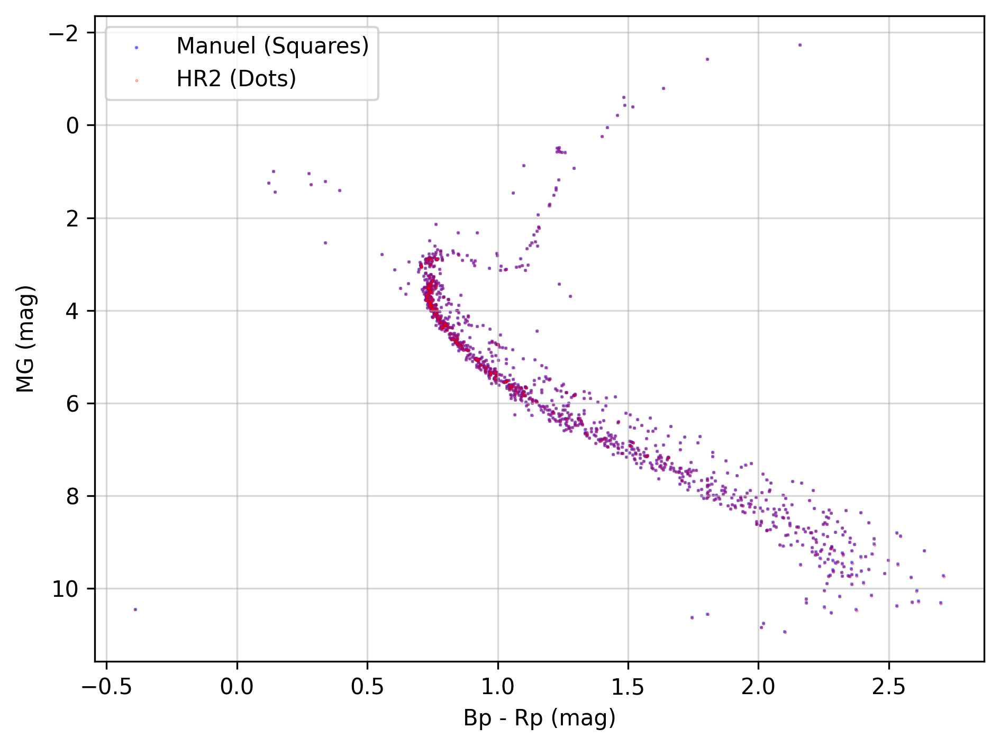

In [56]:
# Common stars b/t the 2 datasets

plt.figure(dpi=300)

# Defining plot inputs
mg_common_manuel = common_stars["manuel_MG_raw"]
bp_rp_common_manuel = common_stars["bp_rp"]
mg_common_hr2 = common_stars["hr2_MG"]
bp_rp_common_hr2 = common_stars["BP-RP"]

# Creating plot
plt.scatter(bp_rp_common_manuel, mg_common_manuel, s=0.1, alpha=0.5, marker="s", ec="b", fc="b", label="Manuel (Squares)")
plt.scatter(bp_rp_common_hr2, mg_common_hr2, s=0.1, alpha=0.5, ec="r", fc="r", label="HR2 (Dots)")
plt.xlabel("Bp - Rp (mag)")
plt.ylabel("MG (mag)")
plt.legend()
plt.gca().invert_yaxis()
plt.tight_layout()
plt.grid(alpha=0.5)

### In MC, not HR2

In [57]:
stars_in_mc_not_in_hr2

,recno,Name,ID,GaiaDR3,inrt,Prob,RA_ICRS,e_RA_ICRS,DE_ICRS,e_DE_ICRS,...,fidelity_v2,cluster_flag,rescaled_flux,manuel_distance_raw,manuel_vra,manuel_vdec,manuel_vra_raw,manuel_vdec_raw,manuel_MG,manuel_MG_raw
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.999023,1,0.000020,860.521104,-48.760347,-13.609372,-46.245137,-12.907358,10.495640,10.610643
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.999512,1,0.000321,912.647951,-47.320591,-12.649641,-48.301864,-12.911952,8.131902,8.087333
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.957031,1,0.000012,446.621441,-41.059261,-12.019390,-22.240483,-6.510517,10.935756,12.267091
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.000000,1,0.003190,854.011404,-41.843822,-10.225519,-43.419020,-10.610456,5.872361,5.792118
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.000000,1,0.000580,933.955126,-47.382842,-10.958306,-48.638060,-11.248603,7.478892,7.422116
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.000000,1,0.002508,877.475806,-44.256793,-11.374749,-45.783501,-11.767139,6.066310,5.992665
22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.878906,1,0.000736,868.565175,-41.644366,-11.469222,-43.943738,-12.102489,7.443905,7.327201
42,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.000000,1,0.001726,865.352080,-42.494956,-12.477097,-43.733334,-12.840702,6.487703,6.425328
73,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.951660,1,0.000008,595.460021,-41.516193,-11.941211,-29.655724,-8.529810,11.088624,11.819169
143,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.000000,1,0.017502,833.160551,-42.391698,-12.516846,-43.958510,-12.979473,4.081242,4.002431


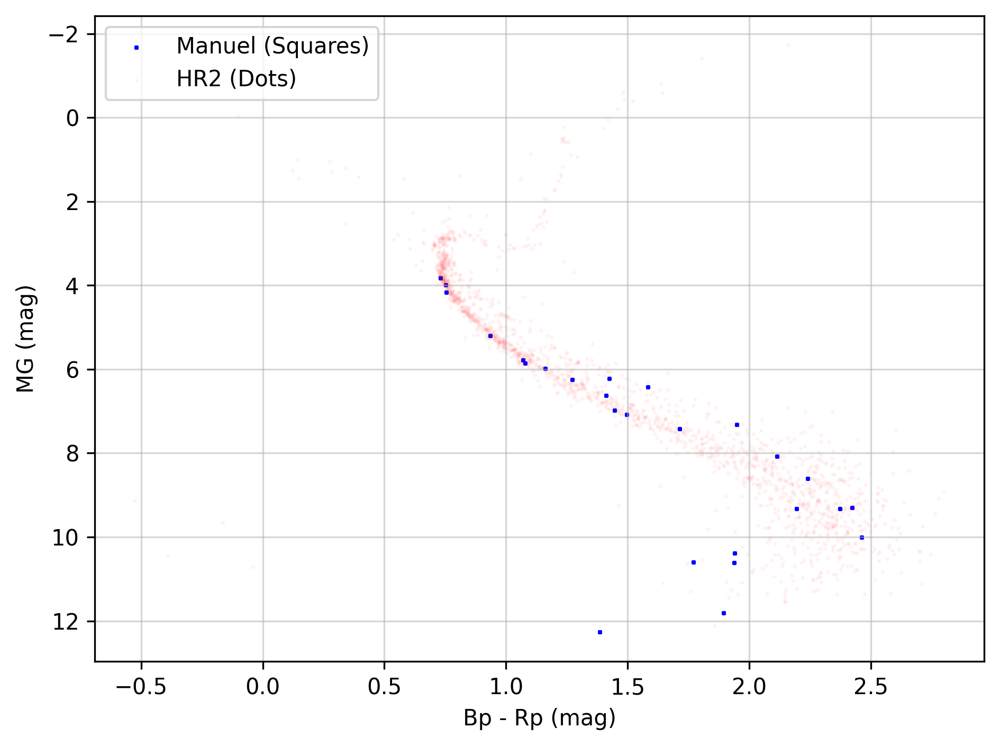

In [58]:
# Stars in the MC dataset, but not in the HR2 dataset
# Plotting MC stars not in HR2, against the HR2 M67 cluster

plt.figure(dpi=300)

# Defining plot inputs
mg_mc_not_hr2 = stars_in_mc_not_in_hr2["manuel_MG_raw"]
bp_rp_mc_not_hr2 = stars_in_mc_not_in_hr2["bp_rp"]
mg_hr2_m67 = hr2_m67["hr2_MG"]
bp_rp_hr2_m67 = hr2_m67["BP-RP"]

# Creating plot
plt.scatter(bp_rp_mc_not_hr2, mg_mc_not_hr2, s=1, alpha=1, marker="s", ec="b", fc="b", label="Manuel (Squares)")
plt.scatter(bp_rp_hr2_m67, mg_hr2_m67, s=1, alpha=0.03, ec="r", fc="r", label="HR2 (Dots)")
plt.xlabel("Bp - Rp (mag)")
plt.ylabel("MG (mag)")
plt.legend()
plt.gca().invert_yaxis()
plt.grid(alpha=0.5)
plt.tight_layout()

### In HR2, not MC

In [59]:
stars_in_hr2_not_in_mc

,recno,Name,ID,GaiaDR3,inrt,Prob,RA_ICRS,e_RA_ICRS,DE_ICRS,e_DE_ICRS,...,fidelity_v2,cluster_flag,rescaled_flux,manuel_distance_raw,manuel_vra,manuel_vdec,manuel_vra_raw,manuel_vdec_raw,manuel_MG,manuel_MG_raw
0,443017,NGC_2682,4606,604931815630738688,0,0.367301,133.228754,0.232885,11.913885,0.120769,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,443019,NGC_2682,4606,604933228676166656,0,0.376948,133.232291,0.076711,11.962825,0.037108,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,443022,NGC_2682,4606,604932988158004352,0,0.276037,133.174532,0.429873,11.951223,0.233769,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,443023,NGC_2682,4606,604933121300811520,0,0.247381,133.201671,0.124318,11.979014,0.065778,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,443024,NGC_2682,4606,604931472033361280,0,0.176246,133.161187,0.314205,11.942171,0.170505,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1833,444850,NGC_2682,4606,604905122410226688,0,0.374923,133.068066,0.050457,11.737014,0.024027,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1835,444852,NGC_2682,4606,604905053690765184,0,0.299053,132.974044,0.047755,11.776273,0.024617,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1837,444854,NGC_2682,4606,604905015035445504,1,0.633262,132.981885,0.123613,11.778627,0.064424,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1842,444859,NGC_2682,4606,604904813174193536,0,0.294074,132.999164,0.340754,11.762115,0.183976,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


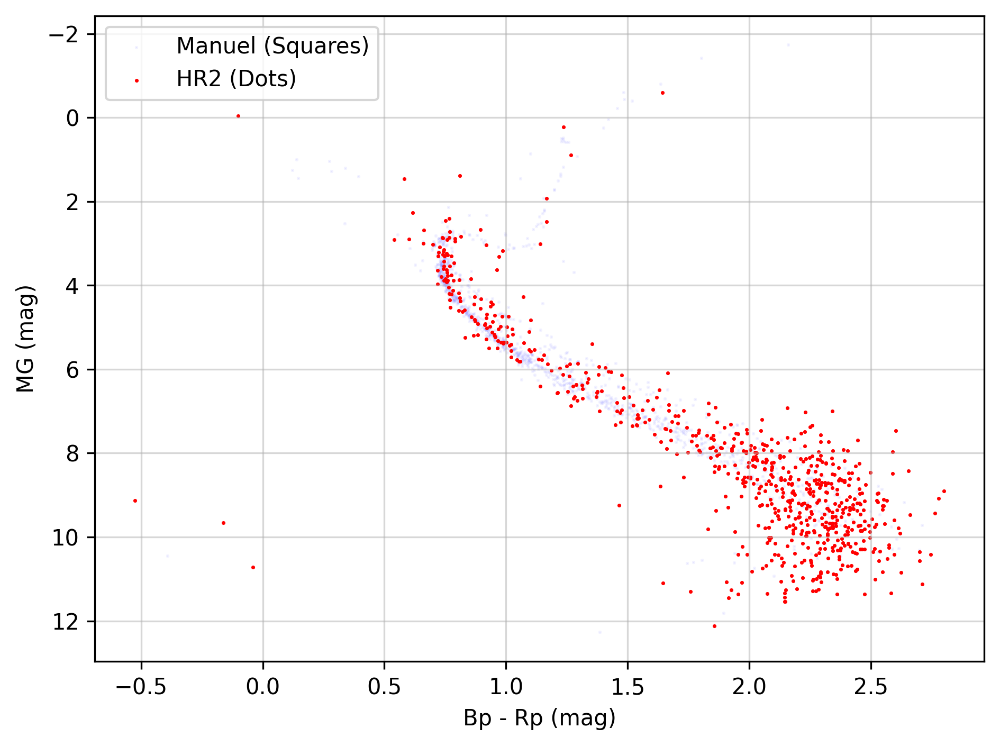

In [60]:
# Stars in the HR2 dataset, but not in the MC dataset
# Plotting the HR2 stars not in MC, against the MC M67 cluster

plt.figure(dpi=300)

# Defining plot inputs
mg_mc = manuel_m67_cluster_candidates["manuel_MG_raw"]
bp_rp_mc = manuel_m67_cluster_candidates["bp_rp"]
mg_hr2_not_mc = stars_in_hr2_not_in_mc["hr2_MG"]
bp_rp_hr2_not_mc = stars_in_hr2_not_in_mc["BP-RP"]

# Creating plot
plt.scatter(bp_rp_mc, mg_mc, s=0.5, alpha=0.05, marker="s", ec="b", fc="b", label="Manuel (Squares)")
plt.scatter(bp_rp_hr2_not_mc, mg_hr2_not_mc, s=0.5, alpha=1, ec="r", fc="r", label="HR2 (Dots)")
plt.xlabel("Bp - Rp (mag)")
plt.ylabel("MG (mag)")
plt.legend()
plt.gca().invert_yaxis()
plt.grid(alpha=0.5)
plt.tight_layout()

# PMs of the Joins

### Recall, you have: common_stars, stars_in_mc_not_in_hr2, and stars_in_hr2_not_in_mc

## Common

In [61]:
# Seeing how the pm coordinates of both datasets compare to each other

common_stars[["pmRA", "pmDE", "pmra", "pmdec"]]

,pmRA,pmDE,pmra,pmdec
0,-10.72,-2.925,-10.719837,-2.924665
1,-11.23,-2.828,-11.231683,-2.828068
2,-10.95,-2.950,-10.953497,-2.950003
3,-11.07,-2.698,-11.073866,-2.697982
4,-10.68,-3.123,-10.681581,-3.122702
...,...,...,...,...
1129,-11.28,-2.958,-11.280095,-2.957544
1130,-11.12,-2.910,-11.119216,-2.910266
1131,-10.77,-3.121,-10.773190,-3.121214
1132,-10.80,-2.975,-10.795762,-2.975356


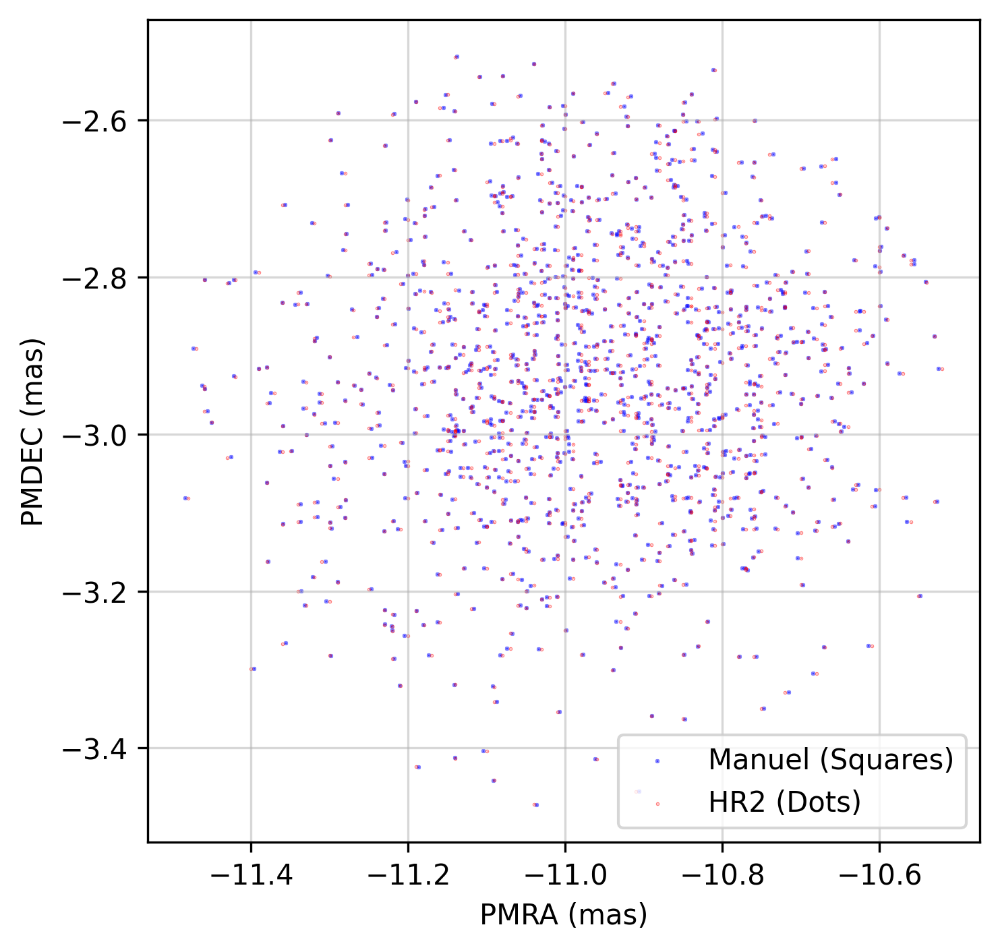

In [62]:
# PMDEC vs PMRA of the common stars

plt.figure(dpi=300)

# Defining plot inputs
pmra_manuel_cc = common_stars.pmra
pmdec_manuel_cc = common_stars.pmdec
pmra_hr2_m67 = common_stars.pmRA
pmdec_hr2_m67 = common_stars.pmDE

# Creating plot
plt.scatter(pmra_manuel_cc, pmdec_manuel_cc, s=0.1, alpha=0.5, marker="s", ec="b", fc="b", label="Manuel (Squares)")
plt.scatter(pmra_hr2_m67, pmdec_hr2_m67, s=0.1, alpha=0.5, ec="r", fc="r", label="HR2 (Dots)")
plt.xlabel("PMRA (mas)")
plt.ylabel("PMDEC (mas)")
plt.grid(alpha=0.5)
plt.legend()
plt.gca().set_aspect(1)
plt.tight_layout()

## In MC, not HR2

In [63]:
stars_in_mc_not_in_hr2[["pmRA", "pmDE", "pmra", "pmdec"]]

,pmRA,pmDE,pmra,pmdec
0,NaN,NaN,-11.337732,-3.164445
1,NaN,NaN,-11.165605,-2.984766
2,NaN,NaN,-10.505732,-3.075372
3,NaN,NaN,-10.726005,-2.621151
4,NaN,NaN,-10.986817,-2.540939
5,NaN,NaN,-11.007673,-2.829159
22,NaN,NaN,-10.673731,-2.939639
42,NaN,NaN,-10.662067,-3.130528
73,NaN,NaN,-10.506972,-3.022097
143,NaN,NaN,-11.131045,-3.286624


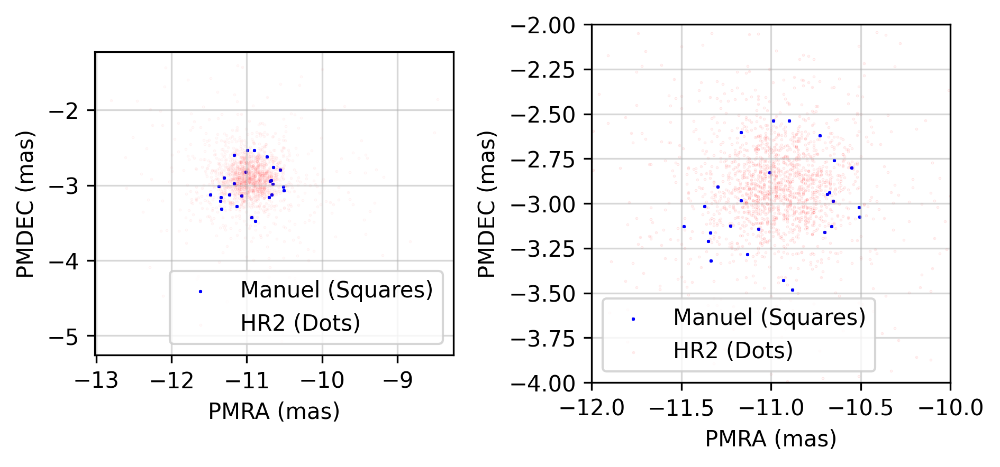

In [64]:
# PMDEC vs. PMRA of the stars in MC, not in HR2, against all of HR2

plt.figure(dpi=300)

# Defining plot inputs
pmra_manuel_cc = stars_in_mc_not_in_hr2.pmra
pmdec_manuel_cc = stars_in_mc_not_in_hr2.pmdec
pmra_hr2_m67 = hr2_m67.pmRA
pmdec_hr2_m67 = hr2_m67.pmDE
x_label = "PMRA (mas)"
y_label = "PMDEC (mas)"

#All-field (left)
plt.subplot(1, 2, 1)
plt.scatter(pmra_manuel_cc, pmdec_manuel_cc, s=0.1, alpha=1, marker="s", ec="b", fc="b", label="Manuel (Squares)")
plt.scatter(pmra_hr2_m67, pmdec_hr2_m67, s=0.1, alpha=0.05, ec="r", fc="r", label="HR2 (Dots)")
plt.xlabel(x_label)
plt.ylabel(y_label)
plt.grid(alpha=0.5)
plt.legend()
plt.gca().set_aspect(1)
plt.tight_layout()

# Zoomed in to the cluster (right)
plt.subplot(1, 2, 2)
plt.scatter(pmra_manuel_cc, pmdec_manuel_cc, s=0.1, alpha=1, marker="s", ec="b", fc="b", label="Manuel (Squares)")
plt.scatter(pmra_hr2_m67, pmdec_hr2_m67, s=0.1, alpha=0.1, ec="r", fc="r", label="HR2 (Dots)")
plt.xlabel(x_label)
plt.ylabel(y_label)
plt.xlim(-12, -10)
plt.ylim(-4, -2)
plt.grid(alpha=0.5)
plt.legend()
plt.gca().set_aspect(1)
plt.tight_layout()

## In HR2, not MC

In [65]:
stars_in_hr2_not_in_mc[["pmRA", "pmDE", "pmra", "pmdec"]]

,pmRA,pmDE,pmra,pmdec
0,-11.43,-2.599,NaN,NaN
2,-11.59,-3.036,NaN,NaN
5,-12.03,-2.956,NaN,NaN
6,-11.26,-2.718,NaN,NaN
7,-10.93,-2.388,NaN,NaN
...,...,...,...,...
1833,-11.78,-2.607,NaN,NaN
1835,-10.88,-2.788,NaN,NaN
1837,-10.55,-2.768,NaN,NaN
1842,-10.87,-2.353,NaN,NaN


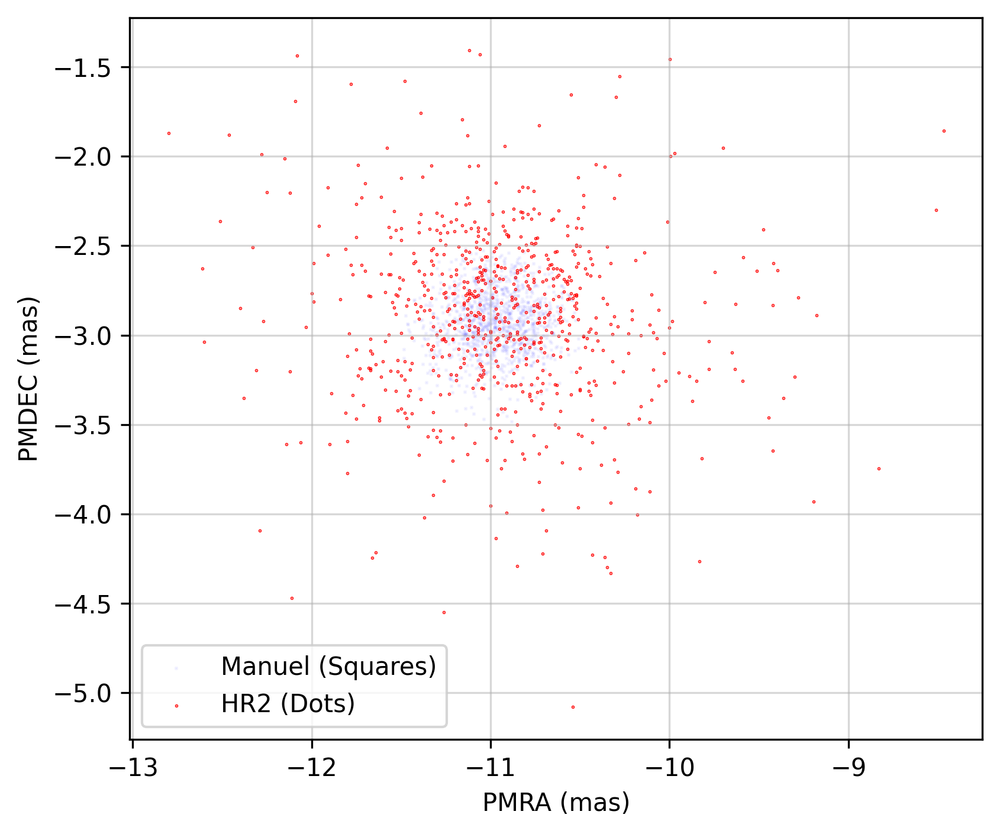

In [66]:
# PMDEC vs. PMRA of the stars in HR2, not in MC, against all of MC

plt.figure(dpi=300)

# Defining plot inputs
pmra_manuel_cc = manuel_m67_cluster_candidates.pmra
pmdec_manuel_cc = manuel_m67_cluster_candidates.pmdec
pmra_hr2_m67 = stars_in_hr2_not_in_mc.pmRA
pmdec_hr2_m67 = stars_in_hr2_not_in_mc.pmDE

# Creating plot
plt.scatter(pmra_manuel_cc, pmdec_manuel_cc, s=0.1, alpha=0.05, marker="s", ec="b", fc="b", label="Manuel (Squares)")
plt.scatter(pmra_hr2_m67, pmdec_hr2_m67, s=0.1, alpha=1, ec="r", fc="r", label="HR2 (Dots)")
plt.xlabel("PMRA (mas)")
plt.ylabel("PMDEC (mas)")
plt.grid(alpha=0.5)
plt.legend()
plt.gca().set_aspect(1)
plt.tight_layout()

# Velocities of the Joins

## Common

In [67]:
common_stars

,recno,Name,ID,GaiaDR3,inrt,Prob,RA_ICRS,e_RA_ICRS,DE_ICRS,e_DE_ICRS,...,fidelity_v2,cluster_flag,rescaled_flux,manuel_distance_raw,manuel_vra,manuel_vdec,manuel_vra_raw,manuel_vdec_raw,manuel_MG,manuel_MG_raw
0,443018,NGC_2682,4606,604931819926896384,0,0.471618,133.229893,0.042849,11.916881,0.021172,...,1.0,1,0.001791,840.745597,-41.427220,-11.302478,-42.719989,-11.655180,6.515060,6.448334
1,443020,NGC_2682,4606,604933018221557120,1,0.570397,133.198521,0.021742,11.957266,0.011263,...,1.0,1,0.006798,906.509080,-46.336011,-11.667121,-48.260893,-12.151794,4.932636,4.844253
2,443021,NGC_2682,4606,604932404042610176,1,0.605382,133.247746,0.035353,11.947294,0.016888,...,1.0,1,0.002943,893.275980,-44.768150,-12.056987,-46.378508,-12.490690,5.858187,5.781449
3,443025,NGC_2682,4606,604933125596954240,1,0.607795,133.197591,0.025558,11.969062,0.012012,...,1.0,1,0.005941,884.101951,-44.808811,-10.916996,-46.406622,-11.306279,5.120626,5.044544
4,443027,NGC_2682,4606,604930754775030400,1,0.565926,133.082196,0.035280,11.872999,0.018395,...,1.0,1,0.002222,839.807966,-40.807700,-11.929910,-42.520061,-12.430510,6.307758,6.218499
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1129,444853,NGC_2682,4606,604905019331023104,1,0.601979,132.986384,0.044853,11.781827,0.022784,...,1.0,1,0.001572,915.826576,-48.005138,-12.586535,-48.967097,-12.838753,6.445526,6.402443
1130,444855,NGC_2682,4606,604904950611554432,1,0.978113,132.959127,0.021849,11.768576,0.010914,...,1.0,1,0.302581,848.807720,-43.409021,-11.361575,-44.736481,-11.709016,0.934099,0.868690
1131,444856,NGC_2682,4606,604904881892076032,1,0.679668,132.968238,0.113929,11.764310,0.062545,...,1.0,1,0.000305,822.167002,-42.219602,-12.231884,-41.983892,-12.163594,8.356613,8.368771
1132,444857,NGC_2682,4606,604904847532342528,1,0.608151,132.959196,0.021412,11.749179,0.011199,...,1.0,1,0.022428,944.753757,-46.378292,-12.782046,-48.344855,-13.324039,3.550661,3.460484


In [68]:
# Before we do anything, we first have to calculate the velocities for the HR2 M67 stars in the common dataset
# I'm going to use D for HR2 as the r_med_geo from MC dataset because if these are the same stars and these are their corrected distances, it should apply
# Maybe these distance calculations came out after HR2 was published

# Common stars velocity calculations

pmra = common_stars.pmRA
pmdec = common_stars.pmDE
D = common_stars.hr2_distance_raw
vra = vra_calculations(pmra, D)
vdec = vdec_calculations(pmdec, D)
common_stars = common_stars.assign(hr2_m67_vra=vra, hr2_m67_vdec=vdec)

pmra = common_stars.pmra
pmdec = common_stars.pmdec
D = common_stars.manuel_distance_raw
vra = vra_calculations(pmra, D)
vdec = vdec_calculations(pmdec, D)
common_stars = common_stars.assign(manuel_vra_raw=vra, manuel_vdec_raw=vdec)

common_stars[["manuel_vra_raw", "manuel_vdec_raw", "hr2_m67_vra", "hr2_m67_vdec"]]

,manuel_vra_raw,manuel_vdec_raw,hr2_m67_vra,hr2_m67_vdec
0,-42.719989,-11.655180,-42.735744,-11.660639
1,-48.260893,-12.151794,-48.259474,-12.152965
2,-46.378508,-12.490690,-46.383378,-12.495979
3,-46.406622,-11.306279,-46.394164,-11.307268
4,-42.520061,-12.430510,-42.504786,-12.429068
...,...,...,...,...
1129,-48.967097,-12.838753,-48.962637,-12.839670
1130,-44.736481,-11.709016,-44.744312,-11.709168
1131,-41.983892,-12.163594,-41.981743,-12.165740
1132,-48.344855,-13.324039,-48.385633,-13.328450


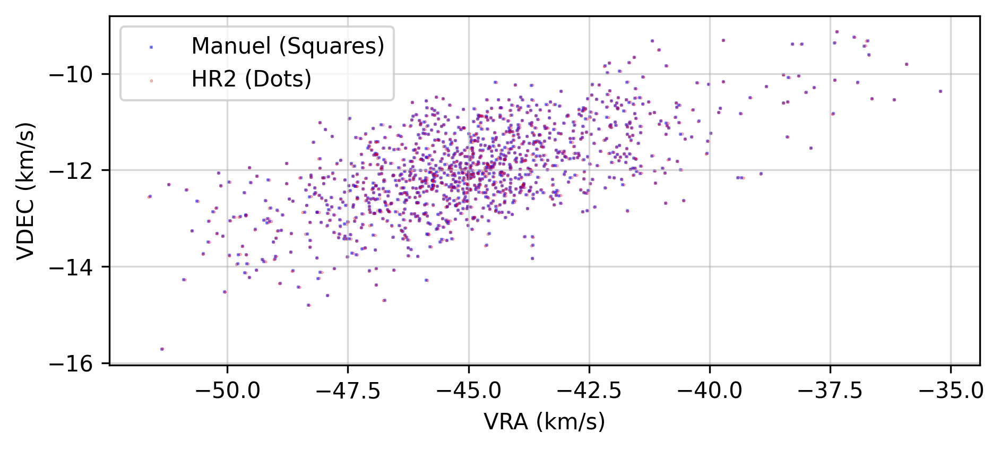

In [69]:
# VDEC vs. VRA of the common stars

plt.figure(dpi=300)

# Defining plot inputs
vra_maneul_cc = common_stars.manuel_vra_raw
vdec_manuel_cc = common_stars.manuel_vdec_raw
vra_hr2_m67 = common_stars.hr2_m67_vra
vdec_hr2_m67 = common_stars.hr2_m67_vdec

# Creating plot
plt.scatter(vra_maneul_cc, vdec_manuel_cc, s=0.1, alpha=0.5, marker="s", ec="b", fc="b", label="Manuel (Squares)")
plt.scatter(vra_hr2_m67, vdec_hr2_m67, s=0.1, alpha=0.5, ec="r", fc="r", label="HR2 (Dots)")
plt.xlabel("VRA (km/s)")
plt.ylabel("VDEC (km/s)")
plt.grid(alpha=0.5)
plt.legend()
plt.gca().set_aspect(1)
plt.tight_layout()

## In MC, not in HR2

In [70]:
stars_in_mc_not_in_hr2

,recno,Name,ID,GaiaDR3,inrt,Prob,RA_ICRS,e_RA_ICRS,DE_ICRS,e_DE_ICRS,...,fidelity_v2,cluster_flag,rescaled_flux,manuel_distance_raw,manuel_vra,manuel_vdec,manuel_vra_raw,manuel_vdec_raw,manuel_MG,manuel_MG_raw
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.999023,1,0.000020,860.521104,-48.760347,-13.609372,-46.245137,-12.907358,10.495640,10.610643
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.999512,1,0.000321,912.647951,-47.320591,-12.649641,-48.301864,-12.911952,8.131902,8.087333
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.957031,1,0.000012,446.621441,-41.059261,-12.019390,-22.240483,-6.510517,10.935756,12.267091
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.000000,1,0.003190,854.011404,-41.843822,-10.225519,-43.419020,-10.610456,5.872361,5.792118
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.000000,1,0.000580,933.955126,-47.382842,-10.958306,-48.638060,-11.248603,7.478892,7.422116
5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.000000,1,0.002508,877.475806,-44.256793,-11.374749,-45.783501,-11.767139,6.066310,5.992665
22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.878906,1,0.000736,868.565175,-41.644366,-11.469222,-43.943738,-12.102489,7.443905,7.327201
42,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.000000,1,0.001726,865.352080,-42.494956,-12.477097,-43.733334,-12.840702,6.487703,6.425328
73,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.951660,1,0.000008,595.460021,-41.516193,-11.941211,-29.655724,-8.529810,11.088624,11.819169
143,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.000000,1,0.017502,833.160551,-42.391698,-12.516846,-43.958510,-12.979473,4.081242,4.002431


In [71]:
# Raw velocity calculations for the entire HR2 dataset to be used in the following plot

pmra = hr2_m67.pmRA
pmdec = hr2_m67.pmDE
D = hr2_m67.hr2_distance_raw
vra = vra_calculations(pmra, D)
vdec = vdec_calculations(pmdec, D)
hr2_m67 = hr2_m67.assign(hr2_m67_vra_raw=vra, hr2_m67_vdec_raw=vdec)
hr2_m67[["hr2_m67_vra_raw", "hr2_m67_vdec_raw"]]

,hr2_m67_vra_raw,hr2_m67_vdec_raw
443016,-44.812407,-10.189628
443017,-42.735744,-11.660639
443018,-46.754553,-12.247353
443019,-48.259474,-12.152965
443020,-46.383378,-12.495979
...,...,...
444855,-41.981743,-12.165740
444856,-48.385633,-13.328450
444857,-49.216262,-13.901047
444858,-58.383909,-12.638210


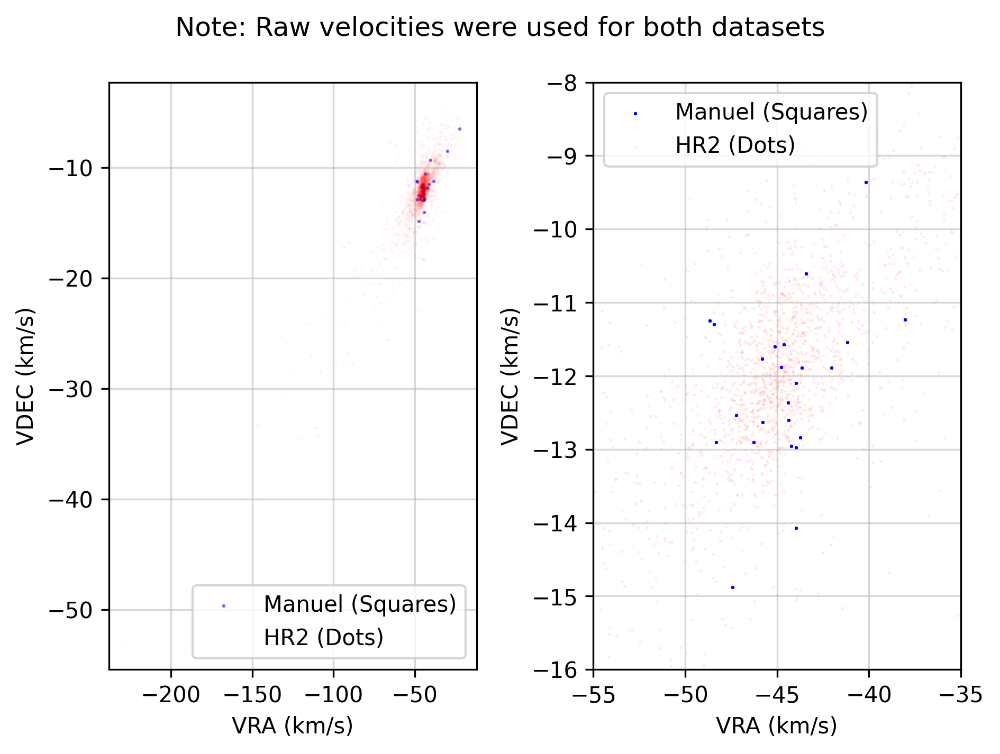

In [72]:
# VDEC vs. VRA of the stars in MC, not in HR2, against all of HR2

plt.figure(dpi=300)
plt.suptitle("Note: Raw velocities were used for both datasets")

# Defining plot inputs
vra_maneul_cc = stars_in_mc_not_in_hr2.manuel_vra_raw
vdec_manuel_cc = stars_in_mc_not_in_hr2.manuel_vdec_raw
vra_hr2_m67 = hr2_m67.hr2_m67_vra_raw
vdec_hr2_m67 = hr2_m67.hr2_m67_vdec_raw

# All-sky (left)
plt.subplot(1, 2, 1)
plt.scatter(vra_maneul_cc, vdec_manuel_cc, s=0.1, alpha=0.5, marker="s", ec="b", fc="b", label="Manuel (Squares)")
plt.scatter(vra_hr2_m67, vdec_hr2_m67, s=0.1, alpha=0.05, ec="r", fc="r", label="HR2 (Dots)")
plt.xlabel("VRA (km/s)")
plt.ylabel("VDEC (km/s)")
plt.grid(alpha=0.5)
plt.legend()
plt.tight_layout()

# Zoomed in to the cluster (right)
plt.subplot(1, 2, 2)
plt.scatter(vra_maneul_cc, vdec_manuel_cc, s=0.1, alpha=1, marker="s", ec="b", fc="b", label="Manuel (Squares)")
plt.scatter(vra_hr2_m67, vdec_hr2_m67, s=0.1, alpha=0.1, ec="r", fc="r", label="HR2 (Dots)")
plt.xlabel("VRA (km/s)")
plt.ylabel("VDEC (km/s)")
plt.xlim(-55, -35)
plt.ylim(-16, -8)
plt.grid(alpha=0.5)
plt.legend()
plt.tight_layout()

## In HR2, not MC

In [73]:
stars_in_hr2_not_in_mc

,recno,Name,ID,GaiaDR3,inrt,Prob,RA_ICRS,e_RA_ICRS,DE_ICRS,e_DE_ICRS,...,fidelity_v2,cluster_flag,rescaled_flux,manuel_distance_raw,manuel_vra,manuel_vdec,manuel_vra_raw,manuel_vdec_raw,manuel_MG,manuel_MG_raw
0,443017,NGC_2682,4606,604931815630738688,0,0.367301,133.228754,0.232885,11.913885,0.120769,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,443019,NGC_2682,4606,604933228676166656,0,0.376948,133.232291,0.076711,11.962825,0.037108,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,443022,NGC_2682,4606,604932988158004352,0,0.276037,133.174532,0.429873,11.951223,0.233769,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,443023,NGC_2682,4606,604933121300811520,0,0.247381,133.201671,0.124318,11.979014,0.065778,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,443024,NGC_2682,4606,604931472033361280,0,0.176246,133.161187,0.314205,11.942171,0.170505,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1833,444850,NGC_2682,4606,604905122410226688,0,0.374923,133.068066,0.050457,11.737014,0.024027,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1835,444852,NGC_2682,4606,604905053690765184,0,0.299053,132.974044,0.047755,11.776273,0.024617,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1837,444854,NGC_2682,4606,604905015035445504,1,0.633262,132.981885,0.123613,11.778627,0.064424,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1842,444859,NGC_2682,4606,604904813174193536,0,0.294074,132.999164,0.340754,11.762115,0.183976,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [74]:
# Raw distance and velocity calculations for the stars in HR2, but not in MC

parallax = stars_in_hr2_not_in_mc.Plx
distance_raw = distance_raw_calculations(parallax)
stars_in_hr2_not_in_mc = stars_in_hr2_not_in_mc.assign(hr2_distance_raw_not_in_mc=distance_raw)

pmra = stars_in_hr2_not_in_mc.pmRA
pmdec = stars_in_hr2_not_in_mc.pmDE
D = stars_in_hr2_not_in_mc.hr2_distance_raw_not_in_mc
vra = vra_calculations(pmra, D)
vdec = vdec_calculations(pmdec, D)
stars_in_hr2_not_in_mc = stars_in_hr2_not_in_mc.assign(hr2_m67_vra_raw_not_in_mc=vra, hr2_m67_vdec_raw_not_in_mc=vdec)

stars_in_hr2_not_in_mc[["hr2_m67_vra_raw_not_in_mc", "hr2_m67_vdec_raw_not_in_mc"]]

,hr2_m67_vra_raw_not_in_mc,hr2_m67_vdec_raw_not_in_mc
0,-44.812407,-10.189628
2,-46.754553,-12.247353
5,-52.506630,-12.901878
6,-61.411115,-14.823749
7,-105.644780,-23.081403
...,...,...
1833,-46.376412,-10.263439
1835,-63.223244,-16.200956
1837,-41.362283,-10.852208
1842,-58.383909,-12.638210


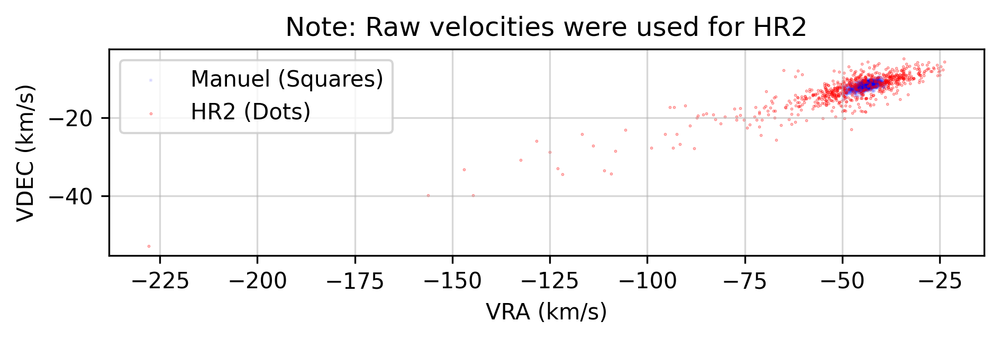

In [75]:
# VDEC vs. VRA of the stars in HR2, not in MC, against all of MC

plt.figure(dpi=300)

# Defining plot inputs
vra_maneul_cc = manuel_m67_cluster_candidates.manuel_vra
vdec_manuel_cc = manuel_m67_cluster_candidates.manuel_vdec
vra_hr2_m67 = stars_in_hr2_not_in_mc.hr2_m67_vra_raw_not_in_mc
vdec_hr2_m67 = stars_in_hr2_not_in_mc.hr2_m67_vdec_raw_not_in_mc

# Creating plot
plt.scatter(vra_maneul_cc, vdec_manuel_cc, s=0.1, alpha=0.1, marker="s", ec="b", fc="b", label="Manuel (Squares)")
plt.scatter(vra_hr2_m67, vdec_hr2_m67, s=0.1, alpha=0.5, ec="r", fc="r", label="HR2 (Dots)")
plt.title("Note: Raw velocities were used for HR2")
plt.xlabel("VRA (km/s)")
plt.ylabel("VDEC (km/s)")
plt.grid(alpha=0.5)
plt.legend()
plt.gca().set_aspect(1)
plt.tight_layout()

# Simpler way of collecting the differing stars, suggested by Silva in P4 feedback

# This is an easy way to get the count of stars, but I would still need to get the IDs of those stars if he were ever to want them

In [76]:
print('HR2_count, MC_count: ', len(hr2_copy), len(manuel_copy))

for how in ['left', 'right', 'inner', 'outer']:
    result = hr2_copy.merge(manuel_copy, how=how, left_on="GaiaDR3", right_on="SOURCE_ID")
    sel_1 = result.GaiaDR3.isna()
    sel_2 = result.SOURCE_ID.isna()
    print('Result_count, GaiaDR3.isna, SOURCE_ID.isna:\t', len(result), len(result[sel_1]), len(result[sel_2]))

HR2_count, MC_count:  1844 1160
Result_count, GaiaDR3.isna, SOURCE_ID.isna:	 1844 0 710
Result_count, GaiaDR3.isna, SOURCE_ID.isna:	 1160 26 0
Result_count, GaiaDR3.isna, SOURCE_ID.isna:	 1134 0 0
Result_count, GaiaDR3.isna, SOURCE_ID.isna:	 1870 26 710


In [77]:
# A way to display the numbers in a dataframe in a truncated format
pd.options.display.float_format = '{:,.2f}'.format

cols = ['Gmag', 'phot_g_mean_mag', 
        'BP-RP', 'bp_rp', 
        'Plx', 'parallax',
        'hr2_distance_raw', 'manuel_distance_raw', 'r_med_geo',
        'hr2_MG', 'manuel_MG'
       ]

display(common_stars[cols].head())

,Gmag,phot_g_mean_mag,BP-RP,bp_rp,Plx,parallax,hr2_distance_raw,manuel_distance_raw,r_med_geo,hr2_MG,manuel_MG
0,16.07,16.07,1.26,1.26,1.19,1.19,841.04,840.75,815.30,6.45,6.52
1,14.63,14.63,0.88,0.88,1.10,1.10,906.62,906.51,870.35,4.84,4.93
2,15.54,15.54,1.10,1.10,1.12,1.12,893.66,893.28,862.26,5.78,5.86
3,14.78,14.78,0.92,0.92,1.13,1.13,884.17,884.10,853.66,5.04,5.12
4,15.84,15.84,1.21,1.21,1.19,1.19,839.63,839.81,805.99,6.22,6.31
